# Analysis of synonymous codon usage biases in *Arabidopsis thaliana*, in relation to gene expression

### Framing the problem

* The unequal utilization of synonymous codons (CUB) affects numerous cellular processes including translation rates, protein folding and mRNA degradation [[Ref](https://pubmed.ncbi.nlm.nih.gov/29386398/)].

* The use of synonymous codons in the gene coding regions are not random, and CUB is an essential feature of most genomes, which has been reported to have an strong impact on the transcription levels of genes [[Ref](https://pubmed.ncbi.nlm.nih.gov/27671647/)].

* Since codons within a synonymous codon group are translated at different rates, many computational translation models rely on analyzing synonymous codons. One strategy to predict transcription rates, is to focus on CUB observed only in highly expressed genes, which should be under selective pressure to be translated efficiently (and whose CUB may therefore be more indicative of transcription rates) [[Ref](https://www.biorxiv.org/content/10.1101/2020.03.26.010488v1.full)].

* Previous analysis have demonstrated that in some cases, codon usage in genes that were expressed in a broad range of
tissues was influenced primarily by the tissue in which the gene was expressed maximally [[Ref](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3454886/)].

* It is therefore crucial to be able to accurately measure CUB for a given sequence to optimize coding sequences for different applications.

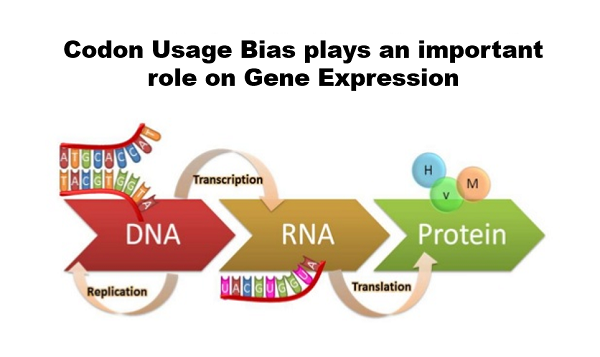

In [514]:
import PIL # image library tool

PIL.Image.open("figures/gene_expression.png")

## 1. Get and process data

### 1.1 Download original datasets

The data sources are:
- for RnaSeq data: https://www.ebi.ac.uk/gxa/experiments-content/E-CURD-1/resources/ExperimentDownloadSupplier.RnaSeqBaseline/tpms.tsv
- for CDS sequences: https://www.arabidopsis.org/download_files/Sequences/Araport11_blastsets/Araport11_genes.201606.cds.fasta.gz

In [2]:
import numpy as np
import pandas as pd
from tqdm import tqdm
pd.set_option('display.max_columns', 1000)
pd.set_option('display.max_rows', 100)

In [1]:
!python -V

Python 3.7.4


In [517]:
from data_utils import download_expression_data, download_cds_data, load_expression_data, load_cds_data

In [521]:
expr_fn = download_expression_data()
cds_fn = download_cds_data()

data/raw/E-CURD-1-query-results.tpms.tsv
data/raw/Araport11_genes.201606.cds.fasta


In [522]:
expr_data = load_expression_data(expr_fn)
cds_data = load_cds_data(cds_fn)

In [523]:
expr_data.shape

(30504, 59)

In [524]:
expr_data.head()

,Gene ID,Gene Name,"FL.04 end of flowering stage, long day length regimen, receptacle, E-GEOD-35288","LP.04 four leaves visible stage, 10/14 h light/dark period and a light intensity of 120 umol m-2s-1, root, E-MTAB-1668","LP.04 four leaves visible stage, 10/14 h light/dark period and a light intensity of 120 umol m-2s-1, shoot, E-MTAB-1668","LP.04 four leaves visible stage, long day length regimen, aerial part, E-GEOD-30795","LP.04 four leaves visible stage, long day length regimen, root, E-GEOD-30795","adult, continuous light regimen, leaf, E-GEOD-54677","adult, long day length regimen, leaf, E-GEOD-44635","adult, long day length regimen, pollen, E-MTAB-4242","adult, short day length regimen, leaf, E-MTAB-4226","adult, short day length regimen; 10 mM MgSO4 buffer; 1 hour, leaf, E-MTAB-4450","adult, short day length regimen; 10 mM MgSO4 buffer; 12 hour, leaf, E-MTAB-4450","adult, short day length regimen; 10 mM MgSO4 buffer; 6 hour, leaf, E-MTAB-4450","flower development stage, continuous light regimen, flower, E-GEOD-49090","gynoecium development stage, long day length regimen, carpel, E-GEOD-56326","gynoecium development stage, long day length regimen, flower bud, E-GEOD-45685","petal differentiation and expansion stage, long day length regimen, floral bud, E-GEOD-30795","seedling, continuous light regimen, flower, E-GEOD-37644","seedling, continuous light regimen, leaf, E-GEOD-37644","seedling, continuous light regimen, leaf, E-GEOD-49090","seedling, continuous light regimen, root, E-MTAB-4391","seedling, continuous light regimen, whole organism, E-GEOD-24970","seedling, continuous light regimen, whole organism, E-GEOD-41432","seedling, continuous light regimen, whole organism, E-GEOD-41433","seedling, continuous light regimen, whole organism, E-MTAB-4417","seedling, continuous light regimen; collected at ZT6, whole organism, E-GEOD-43865","seedling, etiolation, whole organism, E-MTAB-4360","seedling, long day length regimen, aerial part, E-GEOD-40388","seedling, long day length regimen, aerial part, E-GEOD-40482","seedling, long day length regimen, aerial part, E-MTAB-4242","seedling, long day length regimen, leaf, E-GEOD-48851","seedling, long day length regimen, root, E-GEOD-53198","seedling, long day length regimen, root, E-MTAB-4405","seedling, long day length regimen, rosette, E-MTAB-4193","seedling, long day length regimen, whole organism, E-GEOD-32216","seedling, long day length regimen, whole organism, E-GEOD-32318","seedling, long day length regimen, whole organism, E-GEOD-34840","seedling, long day length regimen, whole organism, E-GEOD-38400","seedling, long day length regimen, whole organism, E-GEOD-51119","seedling, long day length regimen, whole organism, E-GEOD-51763","seedling, long day length regimen, whole organism, E-MTAB-4387","seedling, long day length regimen, whole organism, E-MTAB-4418","seedling, long day length regimen; collected at ZT10, whole organism, E-GEOD-438650","seedling, long day length regimen; collected at ZT10, whole organism, E-GEOD-438651","seedling, long day length regimen; collected at ZT10, whole organism, E-GEOD-438652","seedling, long day length regimen; collected at ZT14, whole organism, E-GEOD-43865","seedling, long day length regimen; collected at ZT18, whole organism, E-GEOD-43865","seedling, long day length regimen; collected at ZT2, whole organism, E-GEOD-438656","seedling, long day length regimen; collected at ZT2, whole organism, E-GEOD-438657","seedling, long day length regimen; collected at ZT2, whole organism, E-GEOD-438658","seedling, long day length regimen; collected at ZT22, whole organism, E-GEOD-43865","seedling, long day length regimen; collected at ZT6, whole organism, E-GEOD-438653","seedling, long day length regimen; collected at ZT6, whole organism, E-GEOD-438654","seedling, long day length regimen; collected at ZT6, whole organism, E-GEOD-438655","seedling, long day length regimen; collected in shade after 1 hour, mixed leaf and apical meristem, SRP028684

In [535]:
expr_data.to_csv("data/processed/expr_data.csv", index=False) # saving the expr_data file

In [536]:
cds_data.to_csv("data/processed/cds_data.csv", index=False) # # saving the cds_data file

In [2]:
expr_data = pd.read_csv("data/processed/expr_data.csv") # Load the file

In [5]:
cds_data = pd.read_csv("data/processed/cds_data.csv") # Load the file

In [6]:
cds_data.shape

(48359, 4)

In [526]:
cds_data.head()

,Gene ID,Transcript ID,Length,CDS sequence
0,AT1G01010,AT1G01010.1,1290,ATGGAGGATCAAGTTGGGTTTGGGTTCCGTCCGAACGACGAGGAGC...
1,AT1G01020,AT1G01020.1,738,ATGGCGGCGAGTGAACACAGATGCGTGGGATGTGGTTTTAGGGTAA...
2,AT1G01020,AT1G01020.2,576,ATGGCGGCGAGTGAACACAGATGCGTGGGATGTGGTTTTAGGGTAA...
3,AT1G01020,AT1G01020.3,711,ATGAGTACATCGAGTGTGAACGCATGGTCTGTTTTAATCACTTTCT...
4,AT1G01020,AT1G01020.4,711,ATGAGTACATCGAGTGTGAACGCATGGTCTGTTTTAATCACTTTCT...


### 1.2 Preprocess the data

- In the RnaSeq data we calculate for each gene the maximal TPM (Transcripts Per Kilobase Million) value across samples (tissues and developmental stages)
> `Max TPM` is the highest expression level detected for a given gene over all stages or tissues examined. 
- In the CDS (coding DNA sequence data), when there are multiple transcripts per gene, we only keep the longest CDS sequence per gene.

We merge the RnaSeq and CDS sequences in one data frame, joined by Gene ID

> It would be interesing to have the tissue type as a variable in our data set since it has been previously shown that the relaction between condon bias and gene expression in *Arabidopsis thaliana* is tissue specific [[Ref](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3454886/)].
For this I will add `expr_df["Tissues"] = expr_df[cols].idxmax(axis=1)` to the process_data function.

In [7]:
from data_utils import process_data

In [8]:
cds_expr = process_data(expr_data, cds_data)

data/processed/cds_expr.txt


I will parse the tissue type out of all the information given:

In [20]:
def tissue_parser(item):
    
    "takes a string and parse the tissue"
    
    leaf_words = ["aerial part", "rosette", "mixed leaf and apical meristem", "shoot", "leaf"]
    flower_words = ["flower", "carpel", "floral bud", "receptacle"]
    
    if "whole organism" in item:
         return "root/leaf"
        
    elif "pollen" in item:
        return "pollen"
    
    elif any(word in item for word in flower_words):
        return "flower"
    
    elif any(word in item for word in leaf_words):
        return "leaf"
    
    elif "root" in item:
        return "root"
    
    else:
        return "unknown"



In [21]:
cds_expr["Tissue"]= cds_expr["Tissues"].apply(tissue_parser)

In [22]:
cds_expr

,Gene ID,Gene Name,Tissues,Transcript ID,Length,CDS sequence,Tissue
0,AT1G01010,NAC001,"LP.04 four leaves visible stage, 10/14 h light...",AT1G01010.1,1290,ATGGAGGATCAAGTTGGGTTTGGGTTCCGTCCGAACGACGAGGAGC...,root
1,AT1G01020,ARV1,"seedling, long day length regimen; collected a...",AT1G01020.1,738,ATGGCGGCGAGTGAACACAGATGCGTGGGATGTGGTTTTAGGGTAA...,root/leaf
2,AT1G01030,NGA3,"adult, short day length regimen; 10 mM MgSO4 b...",AT1G01030.1,1077,ATGGATCTATCCCTGGCTCCGACAACAACAACAAGTTCCGACCAAG...,leaf
3,AT1G01040,DCL1,"adult, short day length regimen; 10 mM MgSO4 b...",AT1G01040.2,5733,ATGGTAATGGAGGATGAGCCTAGAGAAGCCACAATAAAGCCTTCTT...,leaf
4,AT1G01050,PPA1,"seedling, continuous light regimen, root, E-MT...",AT1G01050.1,639,ATGAGTGAAGAAACTAAAGATAACCAGAGGCTGCAGCGACCAGCTC...,root
...,...,...,...,...,...,...,...
26860,ATMG01350,ORF145C,"seedling, long day length regimen, whole organ...",ATMG01350.1,438,ATGACAAAGCGTGAGTATAATTCTCAACCCGAGATGAAGGAGGAGG...,root/leaf
26861,ATMG01360,COX1,"seedling, long day length regimen, whole organ...",ATMG01360.1,1584,ATGAAAAATCTGGTTCGATGGCTGTTCTCCACAAACCACAAGGATA...,root/leaf
26862,ATMG01370,ORF111D,"seedling, long day length regimen, aerial part...",ATMG01370.1,336,ATGAAAATTTCATATTTCATAAGAAGAGGAAAAAAAACATCGCGAC...,leaf
26863,ATMG01400,ORF105B,"seedling, long day length regimen, whole organ...",ATMG01400.1,318,ATGAAATACCATTTTAGCTCTATGGAGCCGTGGTGGAAAAGAGAAT...,root/leaf


In [23]:
cds_expr.to_csv("data/processed/cds_data.csv", index=False) # saving the cds_expr as a csv file

In [31]:
cds_expr = pd.read_csv("data/processed/cds_expr.txt", sep='\t') # read 

In [3]:
cds_expr.loc[(cds_expr["Length"] == cds_expr["Length"].max())] # gene with largest CDS sequence

,Gene ID,Gene Name,Max TPM,Transcript ID,Length,CDS sequence
5545,AT1G67120,MDN1,26.0,AT1G67120.2,16203,ATGGCTATTGATGGGAGTTTCAACCTTAAACTTGCCTTGGAGACGT...


### 1.3 Translate and encode sequences

For analysis of codon biases it may be useful to translate the CDS sequences into codon sequences and amino acid sequences, and also to one-hot encode them to allow vectorized operations with Numpy.

To transform the list of sequences in numpy arrays, we need to zero pad the one-hot encoded sequences so that their length is equal to the maximal length of all sequences.

> The one_hot encoded sequences can be fed to a deep neural network (DNN) to try predicting the transcription level of the genes. It would be interesting to test which of the one_hot_encoded sequences (nucleotide, codon or aminoacid) yields better results predicting the transcription level of the genes. This may provide valiable information of the predictive value of each sequence.

In [10]:
from sequence_utils import __DNA_MAPPING__, __CODON_MAPPING__, __AMINO_ACID_MAPPING__, __CODON_DICT__, __TRL_MAT__
from sequence_utils import one_hot_encode, translate_one_hot, padding_one_hot

print('\n1-hot encode to dna sequences:')
cds_dna_1hot = [one_hot_encode(seq, __DNA_MAPPING__) for seq in tqdm(cds_expr['CDS sequence'])]

print('\napply padding and make numpy array of 1-hot encoded dna sequences:')
cds_dna_1hot = padding_one_hot(cds_dna_1hot)

print('\n1-hot encode to codon sequences:')
cds_cod_1hot = [one_hot_encode(seq, __CODON_MAPPING__) for seq in tqdm(cds_expr['CDS sequence'])]

print('\ntranslate into 1-hot encoded amino acid sequences:')
cds_aa_1hot = [translate_one_hot(seq_1hot) for seq_1hot in tqdm(cds_cod_1hot)]

print('\napply padding and make numpy array of 1-hot encoded codon sequences:')
cds_cod_1hot = padding_one_hot(cds_cod_1hot)

print('\napply padding and make numpy array of 1-hot encoded amino acid sequences:')
cds_aa_1hot = padding_one_hot(cds_aa_1hot)

  6%|████▎                                                                        | 335/6000 [00:00<00:01, 3316.86it/s]


1-hot encode to dna sequences:


 66%|█████████████████████████████████████████████████▏                         | 3935/6000 [00:00<00:00, 19326.13it/s]


apply padding and make numpy array of 1-hot encoded dna sequences:


  5%|███▋                                                                         | 288/6000 [00:00<00:01, 2879.97it/s]


1-hot encode to codon sequences:


  0%|                                                                                         | 0/6000 [00:00<?, ?it/s]


translate into 1-hot encoded amino acid sequences:


  2%|█▌                                                                           | 118/6000 [00:00<00:05, 1168.32it/s]


apply padding and make numpy array of 1-hot encoded codon sequences:


  0%|                                                                                         | 0/6000 [00:00<?, ?it/s]


apply padding and make numpy array of 1-hot encoded amino acid sequences:


100%|████████████████████████████████████████████████████████████████████████████| 6000/6000 [00:01<00:00, 4276.33it/s]


In [11]:
print(f"cds_dna_hot.shape: ({cds_dna_1hot.shape[0]}, {cds_dna_1hot.shape[1]}, {cds_dna_1hot.shape[2]})")
print(f"cds_cod_hot.shape: ({cds_cod_1hot.shape[0]}, {cds_cod_1hot.shape[1]}, {cds_cod_1hot.shape[2]})")
print(f"cds_aa_hot.shape: ({cds_aa_1hot.shape[0]}, {cds_aa_1hot.shape[1]}, {cds_aa_1hot.shape[2]})")

cds_dna_hot.shape: (6000, 14121, 4)
cds_cod_hot.shape: (6000, 4707, 64)
cds_aa_hot.shape: (6000, 4707, 21)


⚠ High memory usage

## 2. Definitions/Codon Usage Metrics

Some of the following definitions may be useful for your analysis. It is not necessary to use all of these in your analysis, and you may also use other measures. Use them where you see value for interpreting the relationship between biases in synonymous codon usage and expression levels.

- $x_{ij}$: **number of occurences** of the $j$-th codon for the $i$-th amino acid
- $n_i$: **number of alternative codons** for the $i$-th amino acid
- $\sum_{j=1}^{n_i}x_{ij}$: **number of amino acid occurences** for the $i$-th amino acid (repeated for corresponding $j$-th codons)
- $\frac{1}{n_i}\sum_{j=1}^{n_i}x_{ij}$: the $j$-th **expected codon frequency** under the assumption of equal usage of the synonymous codons for an $i$-th amino acid
- $\text{RSCU}_{ij}$: **relative synonymous codon usage**, the observed frequency for a codon divided by the frequency expected under the assumption of equal usage of the synonymous codons for an amino acid. *Normalized value:*

\begin{equation}
\text{RSCU}_{ij} = \frac{x_{ij}}{\frac{1}{n_i}\sum_{j=1}^{n_i}x_{ij}}
\end{equation}
- $\text{RSCU}_{i_\text{max}}$: **RSCU for the most frequently used codon** for the $i$-th amino acid
- $\text{x}_{i_\text{max}}$: **codon frequency for the most frequently used codon** for the $i$-th amino acid
- $w_{ij}$: **relative adaptiveness** of the $j$-th codon for the $i$-th amino acid

\begin{equation}
w_{ij} = \frac{\text{RSCU}_{ij}}{\text{RSCU}_{i_\text{max}}} = \frac{x_{ij}}{x_{i_{\text{max}}}}
\end{equation}
- $L$: **length of a gene** in number of codons
- $\text{CAI}$: **codon adaptation index (CAI)** for a CDS is the geometric mean of the RSCU values corresponding to each of the codons used in that CDS, divided by the maximum possible CAI for a CDS of the same amino acid composition

\begin{equation}
\text{CAI}=\frac{\text{CAI}_\text{obs}}{\text{CAI}_\text{max}} = \frac{\left(\prod_{k=1}^L \text{RSCU}_k\right)^\frac{1}{L}}{\left(\prod_{k=1}^L \text{RSCU}_{k_\text{max}}\right)^\frac{1}{L}}=\left(\prod_{k=1}^L w_k\right)^{\frac{1}{L}}
\end{equation}

I will also include:

* **GC-Content (GC%)** of synonymous codons has been reported to strongly influence amino acid (aa) usage. In particular the GC-Content of aa in the first, second and third position. Hence, these parameters offer important information to estimate CUB.

* **Nc**: 

    This metric quantifies how far the codon usage of a gene deviates from equal usage of synonymous codons. It is one of the most used metric to estimate CUB.

    Nc ranges from 20 and 61. 20 represents **extreme bias** where one codon is exclusively used for each aa, whereas 61 reflects an equal use of alternative synonymous codons across the gene (**no bias**).

## 3. Data analyses

#### Schema: 

Two main approaches were taken to better undestand the role of CUB on the transcription level:

* **Data Analyses, feature selection and and Machine Learnig**: 

> What features can explain better the observed differences in the transcription level?. 

> Here we hypothesize that the CUB plays an important role in transcription levels.

    1) Characterization of codon usage -> calculate the CUB metrics.
    
    2) Exploratory Data Anlyses and Feature selection.
    
    3) A traditional machine learning approach.
    
* **Deep Learning Approach:**

> In this section I used a CNN to predict Max TPM from one_hot_encoded sequeces in order to study which sequence has more predictive power.

> The hyphothesis is that the codon sequence largely determines the transcription level of a gene.

    1) Train a CNN to predict transcription levels from codon one_hot encoded sequences (nucleotides, codons and aminoacids).
    
    2) Compare model performance
    
* **Conclussions**:

* **Future Directions**:

Import necessary libraries for plotting:

In [1]:
import datetime as dt

# Plotting
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as mc
import plotly.express as px
import plotly.graph_objects as go
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")
warnings.filterwarnings("ignore", category=DeprecationWarning) 

import plotly.io as pio

In [2]:
# Some issues currently exist to render the interactive pyplots on nbviewer. 
# As temporal solution we can set the render = svg to at least display non-interactive plots 

pio.renderers.default = "svg"

### **Step 1**: Characterization of codon usage

> Different metrics can be used to evaluate the effect of codon usage bias of genes on transcription levels.

> As a first step, I will create a DataFrame containing some of the most relevant CUB metrics decribed in the literature.

> Some of the functions defined to calculate each metric can be found in ``metrics_calc.py``.
 

* **RSCU**: First, I will calculate RSCU for each codon in each gene. 

In [94]:
from metrics_calc import Count_Codons, RSCU_calc

In [7]:
cds_expr["codonsDict"] = cds_expr["CDS sequence"].apply(lambda x: Count_Codons(x))

In [8]:
cds_expr["RSCU_codons"] = cds_expr["codonsDict"].apply(lambda x: RSCU_calc(x))

* **CAI**: To calculate CAI for each gene I will employ the [Bio.SeqUtils.CodonUsage module](https://biopython.org/docs/1.75/api/Bio.SeqUtils.CodonUsage.html)

In [5]:
from Bio import SeqIO
from Bio.Seq import Seq
from Bio.SeqUtils.CodonUsage import CodonAdaptationIndex
CAI = CodonAdaptationIndex()

We need to provide a codon usage index. For this, I retrieved the frequency for each codon in the Arabidopsis reference genome. The data is available at [https://hive.biochemistry.gwu.edu](https://hive.biochemistry.gwu.edu/dna.cgi?cmd=tissue_codon_usage&id=586358&mode=cocoputs).

In [6]:
ArabidopsisIndex = {
    "GCA": .1812, "GCC": .936, "GCG": .802, "GCT": .2722,
    "AGA": .1960, "AGG": .1110, "CGA": .631, "CGC": .368,
    "CGG": .481, "CGT": .849, "AAC": .2008, "AAT": .2376,
    "GAC": .1659, "GAT": .3761, "TGC": .737, "TGT": .1092,
    "CAA": .2017, "CAG": .1563, "GAA": .3609, "GAG": .3200,
    "GGA": .2333, "GGC": .878, "GGG": .1015, "GGT": .2121,
    "CAC": .833, "CAT": .1442, "ATA": .1362, "ATC": .1719,
    "ATT": .2190, "CTA": .1031, "CTC": .1493, "CTG": .1052,
    "CTT": .2463, "TTA": .1339, "TTG": .2154, "AAA": .3160,
    "AAG": .3216, "ATG": .2443, "TTC": .1934, "TTT": .2263,
    "CCA": .1635, "CCC": .510, "CCG": .760, "CCT": .1855,
    "AGC": .1163, "AGT": .1513, "TCA": .1957, "TCC": .1085,
    "TCG": .882, "TCT": .2593, "ACA": .1642, "ACC": .955,
    "ACG": .708, "ACT": .1744, "TGG": .1221, "TAC": .1274,
    "TAT": .1519, "GTA": .1055, "GTC": .1191, "GTG": .1677,
    "GTT": .2694}

In [7]:
CAI.set_cai_index(ArabidopsisIndex)

cds_expr["CAI"] = cds_expr["CDS sequence"].apply(lambda x: CAI.cai_for_gene(x))


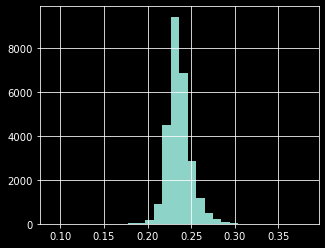

In [9]:
plt.rcParams["figure.figsize"] = (5,4)
plt.style.use("dark_background")
cds_expr["CAI"].hist(bins=30)
plt.show()

* Calculation of **G/C %**: 

> Next, I will calculate GC% (total), GC1% (position 1 of codon), GC2% (position 2 of codon) and GC%3 (position 3 of codon)


In [19]:
from Bio.SeqUtils import GC123 # Calculates G+C content: total, for first, second and third positions.

cds_expr["GC123%"] = cds_expr["CDS sequence"].apply(lambda x: GC123(x))

* Calculation of **Nc**: Effective number of codons for each gene.

> The Nc for each aa (Ncaa)  is calculated and added together to get an effective number of codons Nc for the whole gene. 

In [20]:
from metrics_calc import Nc_calculator, Ncaa_calc_dict

In [21]:
cds_expr["Nc"] = cds_expr["CDS sequence"].apply(lambda x: Nc_calculator(x))

In [22]:
# cds_expr["Ncaa"] = cds_expr["CDS sequence"].apply(lambda x: Ncaa_calc_dict(x)) # results in a dict with Ncaa values for each aa

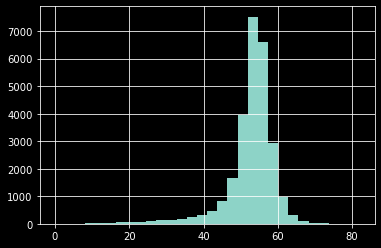

In [23]:
plt.style.use("dark_background")
cds_expr["Nc"].hist(bins=30)
plt.show()

In [24]:
cds_expr.head()

,Gene ID,Gene Name,Max TPM,Transcript ID,Length,CDS sequence,codonsDict,RSCU_codons,CAI,GC123%,Nc
0,AT1G01010,NAC001,46.0,AT1G01010.1,1290,ATGGAGGATCAAGTTGGGTTTGGGTTCCGTCCGAACGACGAGGAGC...,"{'TTT': 8, 'TTC': 9, 'TTA': 1, 'TTG': 10, 'CTT...","{'TGT': 1.0, 'TGC': 1.0, 'GAT': 1.31, 'GAC': 0...",0.120459,"(44.10852713178294, 48.83720930232558, 36.0465...",57.010
1,AT1G01020,ARV1,27.0,AT1G01020.1,738,ATGGCGGCGAGTGAACACAGATGCGTGGGATGTGGTTTTAGGGTAA...,"{'TTT': 10, 'TTC': 8, 'TTA': 4, 'TTG': 11, 'CT...","{'TGT': 0.75, 'TGC': 1.25, 'GAT': 1.667, 'GAC'...",0.100475,"(38.75338753387534, 39.43089430894309, 33.7398...",54.313
2,AT1G01030,NGA3,12.0,AT1G01030.1,1077,ATGGATCTATCCCTGGCTCCGACAACAACAACAAGTTCCGACCAAG...,"{'TTT': 5, 'TTC': 11, 'TTA': 6, 'TTG': 5, 'CTT...","{'TGT': 2.0, 'TGC': 0.0, 'GAT': 1.185, 'GAC': ...",0.109269,"(45.7753017641597, 49.30362116991643, 42.06128...",56.828
3,AT1G01040,DCL1,25.0,AT1G01040.2,5733,ATGGTAATGGAGGATGAGCCTAGAGAAGCCACAATAAAGCCTTCTT...,"{'TTT': 45, 'TTC': 24, 'TTA': 22, 'TTG': 36, '...","{'TGT': 1.257, 'TGC': 0.743, 'GAT': 1.518, 'GA...",0.122998,"(43.764172335600904, 54.683411826268966, 38.19...",50.620
4,AT1G01050,PPA1,172.0,AT1G01050.1,639,ATGAGTGAAGAAACTAAAGATAACCAGAGGCTGCAGCGACCAGCTC...,"{'TTT': 3, 'TTC': 3, 'TTA': 2, 'TTG': 2, 'CTT'...","{'TGT': 2.0, 'TGC': 0.0, 'GAT': 1.0, 'GAC': 1....",0.120323,"(44.60093896713615, 56.8075117370892, 33.80281...",48.680


The columns ``RSCU_codons``, ``GC123%`` and ``Ncaa`` contain dictionaries or lists. 

In the next section I will generate one column containing the value for each of the 61 codons, position and each of the 20 aa respectively. This information can be useful to get insights into what codons or aa play a larger role in CUB and transcription levels. 

*If the value is not present, Nan will be return. Then we can impute the missing values.*

* Lets deal with the ``RSCU_codons`` column first:

> I approached this using a list of dfs and merging them all together on the codon_index. To speed up the procesing time I performed the merging in chunks.

In [25]:
# I will use this index to merge all the df generated for each codon
df_codon_index = pd.DataFrame(
        ['TGT', 'TGC', 'GAT', 'GAC', 'TCT', 'TCG', 'TCA', 'TCC', 'AGC', 'AGT',
       'CAA', 'CAG', 'ATG', 'AAC', 'AAT', 'CCT', 'CCG', 'CCA', 'CCC', 'AAG',
       'AAA', 'ACC', 'ACA', 'ACG', 'ACT', 'TTT', 'TTC', 'GCA', 'GCC', 'GCG',
       'GCT', 'GGT', 'GGG', 'GGA', 'GGC', 'ATC', 'ATA', 'ATT', 'TTA', 'TTG',
       'CTC', 'CTT', 'CTG', 'CTA', 'CAT', 'CAC', 'CGA', 'CGC', 'CGG', 'CGT',
       'AGG', 'AGA', 'TGG', 'GTA', 'GTC', 'GTG', 'GTT', 'GAG', 'GAA', 'TAT',
       'TAC'], columns=["index"]
)

In [26]:
# Using a for loop to make a list of dfs. Each df containing the values for each of the 61 codons

list_dfs = []
n=0
for i in range(len(cds_expr["RSCU_codons"])):
    if  n % 300 == 0: # Append an index column every 300 dfs which will be used later to merge the dfs in chunks on the index column
        list_dfs.append(df_codon_index)
        df = pd.DataFrame.from_dict(cds_expr["RSCU_codons"][i], orient='index', columns=["{}".format(i)]).reset_index()
        list_dfs.append(df)
        n+=1
    else: 
        df = pd.DataFrame.from_dict(cds_expr["RSCU_codons"][i], orient='index', columns=["{}".format(i)]).reset_index()
        list_dfs.append(df)
        n+=1

In [27]:
# I will use chucks of size 300 dfs to speed-up the process of merging all the dfs

from functools import reduce
from IPython.display import clear_output # we can use clear_output to print the progress in one single line

def chunks(lst, n):
    """Yield successive n-sized chunks from lst."""
    for i in range(0, len(lst), n):
        yield lst[i:i + n]
        
df_merged_chunks = []

it = 0
for chunk in chunks(list_dfs, 300):
    start=dt.datetime.now()
    clear_output(wait=True)
    it += 1
    perc=(it/89.55)*100 # 89.55 = number of rows/300
    print("Progress {}%".format(round(perc,1)))
    df = reduce(lambda  left, right: pd.merge(left,right,on=["index"],
                                            how='outer'), chunk) 
    df_merged_chunks.append(df)
    
finished=dt.datetime.now()

Progress 100.5%


In [28]:
# merging all the merged chunks

df_merged = reduce(lambda  left, right: pd.merge(left,right,on=["index"],
                                            how='outer'), df_merged_chunks) 

In [29]:
df_merged = df_merged.set_index("index").T # Transposing the df 

In [32]:
df_merged.columns = ['RSCU_' + str(col) for col in df_merged.columns] # Renaming the column names

In [33]:
df_merged.isna().sum()

RSCU_TGT    1498
RSCU_TGC    1498
RSCU_GAT     219
RSCU_GAC     219
RSCU_TCT      32
RSCU_TCG      32
RSCU_TCA      32
RSCU_TCC      32
RSCU_AGC      32
RSCU_AGT      32
RSCU_CAA     384
RSCU_CAG     384
RSCU_ATG      17
RSCU_AAC     244
RSCU_AAT     244
RSCU_CCT     236
RSCU_CCG     236
RSCU_CCA     236
RSCU_CCC     236
RSCU_AAG     117
RSCU_AAA     117
RSCU_ACC     119
RSCU_ACA     119
RSCU_ACG     119
RSCU_ACT     119
RSCU_TTT     213
RSCU_TTC     213
RSCU_GCA      94
RSCU_GCC      94
RSCU_GCG      94
RSCU_GCT      94
RSCU_GGT     103
RSCU_GGG     103
RSCU_GGA     103
RSCU_GGC     103
RSCU_ATC     116
RSCU_ATA     116
RSCU_ATT     116
RSCU_TTA      24
RSCU_TTG      24
RSCU_CTC      24
RSCU_CTT      24
RSCU_CTG      24
RSCU_CTA      24
RSCU_CAT     938
RSCU_CAC     938
RSCU_CGA     166
RSCU_CGC     166
RSCU_CGG     166
RSCU_CGT     166
RSCU_AGG     166
RSCU_AGA     166
RSCU_TGG    2925
RSCU_GTA      64
RSCU_GTC      64
RSCU_GTG      64
RSCU_GTT      64
RSCU_GAG     174
RSCU_GAA     1

Nan values are filled here with 0s since these are codons are not present in the gene sequence.

In [34]:
df_merged = df_merged.fillna(0)

In [35]:
df_merged.reset_index(drop=True, inplace=True)

In [36]:
df_merged.head()

,RSCU_TGT,RSCU_TGC,RSCU_GAT,RSCU_GAC,RSCU_TCT,RSCU_TCG,RSCU_TCA,RSCU_TCC,RSCU_AGC,RSCU_AGT,RSCU_CAA,RSCU_CAG,RSCU_ATG,RSCU_AAC,RSCU_AAT,RSCU_CCT,RSCU_CCG,RSCU_CCA,RSCU_CCC,RSCU_AAG,RSCU_AAA,RSCU_ACC,RSCU_ACA,RSCU_ACG,RSCU_ACT,RSCU_TTT,RSCU_TTC,RSCU_GCA,RSCU_GCC,RSCU_GCG,RSCU_GCT,RSCU_GGT,RSCU_GGG,RSCU_GGA,RSCU_GGC,RSCU_ATC,RSCU_ATA,RSCU_ATT,RSCU_TTA,RSCU_TTG,RSCU_CTC,RSCU_CTT,RSCU_CTG,RSCU_CTA,RSCU_CAT,RSCU_CAC,RSCU_CGA,RSCU_CGC,RSCU_CGG,RSCU_CGT,RSCU_AGG,RSCU_AGA,RSCU_TGG,RSCU_GTA,RSCU_GTC,RSCU_GTG,RSCU_GTT,RSCU_GAG,RSCU_GAA,RSCU_TAT,RSCU_TAC
0,1.000,1.000,1.310,0.690,1.435,0.652,1.043,0.391,1.174,1.304,0.769,1.231,1.0,1.231,0.769,1.800,0.400,1.000,0.800,1.000,1.000,0.706,0.706,0.471,2.118,0.941,1.059,2.154,0.308,0.308,1.231,1.600,0.640,1.120,0.640,1.111,0.444,1.444,0.240,2.400,1.440,1.200,0.480,0.240,1.000,1.000,0.632,0.632,0.316,1.895,1.263,1.263,1.0,0.296,1.037,0.889,1.778,1.030,0.970,0.947,1.053
1,0.750,1.250,1.667,0.333,2.286,0.286,1.143,0.571,0.857,0.857,1.200,0.800,1.0,0.750,1.250,0.667,1.333,2.000,0.000,1.400,0.600,0.571,1.714,0.000,1.714,1.111,0.889,1.333,0.800,1.333,0.533,2.222,0.444,1.333,0.000,0.857,0.750,1.393,0.706,1.941,0.529,1.235,0.882,0.706,0.400,1.600,0.000,0.429,0.000,0.429,0.429,4.714,1.0,1.333,1.111,0.889,0.667,0.667,1.333,1.111,0.889
2,2.000,0.000,1.185,0.815,1.650,0.300,1.200,1.350,1.350,0.150,1.647,0.353,1.0,1.172,0.828,1.037,1.630,0.889,0.444,0.714,1.286,1.067,1.333,0.800,0.800,0.625,1.375,1.600,0.000,0.400,2.000,0.828,0.690,1.517,0.966,1.091,0.545,1.364,1.286,1.071,1.286,1.071,0.214,1.071,1.111,0.889,0.545,0.000,0.273,1.364,1.364,2.455,1.0,0.444,1.111,1.333,1.111,0.933,1.067,1.286,0.714
3,1.257,0.743,1.518,0.482,1.671,0.600,1.414,0.386,0.771,1.157,1.162,0.838,1.0,0.842,1.158,2.234,0.571,0.779,0.416,0.978,1.022,0.350,1.700,0.750,1.200,1.304,0.696,1.014,0.423,0.676,1.887,1.531,0.812,1.219,0.438,0.846,0.654,1.500,0.786,1.286,0.679,2.214,0.429,0.607,1.318,0.682,0.667,0.111,0.444,0.778,1.778,2.222,1.0,0.428,0.403,0.956,2.214,1.104,0.896,1.143,0.857
4,2.000,0.000,1.000,1.000,1.500,0.000,2.500,1.000,0.500,0.500,0.000,2.000,1.0,1.250,0.750,2.400,0.267,1.067,0.267,1.000,1.000,0.667,1.333,0.000,2.000,1.000,1.000,0.727,0.727,0.364,2.182,1.500,0.000,2.500,0.000,1.312,0.000,1.688,0.632,0.632,1.895,1.579,1.263,0.000,0.667,1.333,0.400,0.400,0.000,2.800,1.200,1.200,1.0,0.235,0.706,1.176,1.882,0.667,1.333,0.600,1.400


Now just need to concatenate `df_merged` and `cds_expr`

In [37]:
cds_expr.shape

(26865, 11)

In [38]:
df_merged.shape

(26865, 61)

I defined a new df containing the CUB metrics (df_CUB_metrics)

In [39]:
df_CUB_metrics = pd.concat([cds_expr, df_merged.reindex(cds_expr.index)], axis=1)

In [40]:
df_CUB_metrics = df_CUB_metrics.drop(["codonsDict", "RSCU_codons"], axis=1) # Dropping columns

In [41]:
import gc

del [[df_merged, df_merged_chunks, list_dfs, array_to_scale, index_list, list_rescaled_data, rescaledX, cds_expr]] #  deleting the variables not needed for next steps for safe memory
gc.collect()

270

* Next the column GC123% is expanded into 4 columns containing the total CG content and the GC content for each of the 3 nucleotide positions of a codon (1,2,3)

In [42]:
df_CUB_metrics[["GC%_Total", "GC%_Pos1", "GC%_Pos2", "GC%_Pos3"]] = pd.DataFrame(df_CUB_metrics["GC123%"].tolist(), index=df_CUB_metrics.index)  

In [43]:
# dropping the GC123% column
df_CUB_metrics = df_CUB_metrics.drop(["GC123%"], axis=1)

In [44]:
df_CUB_metrics.columns = df_CUB_metrics.columns.str.replace("RSCU_", "")

In [45]:
# Renaming the RSCU codon columns to include the aa endoded

__SynonymousCodons_DICT__ = {
        'CYS': ['TGT', 'TGC'],
        'ASP': ['GAT', 'GAC'],
        'SER': ['TCT', 'TCG', 'TCA', 'TCC', 'AGC', 'AGT'],
        'GLN': ['CAA', 'CAG'],
        'MET': ['ATG'],
        'ASN': ['AAC', 'AAT'],
        'PRO': ['CCT', 'CCG', 'CCA', 'CCC'],
        'LYS': ['AAG', 'AAA'],
        'THR': ['ACC', 'ACA', 'ACG', 'ACT'],
        'PHE': ['TTT', 'TTC'],
        'ALA': ['GCA', 'GCC', 'GCG', 'GCT'],
        'GLY': ['GGT', 'GGG', 'GGA', 'GGC'],
        'ILE': ['ATC', 'ATA', 'ATT'],
        'LEU': ['TTA', 'TTG', 'CTC', 'CTT', 'CTG', 'CTA'], 'HIS': ['CAT', 'CAC'],
        'ARG': ['CGA', 'CGC', 'CGG', 'CGT', 'AGG', 'AGA'],
        'TRP': ['TGG'],
        'VAL': ['GTA', 'GTC', 'GTG', 'GTT'],
        'GLU': ['GAG', 'GAA'],
        'TYR': ['TAT', 'TAC']}

for key, value in __SynonymousCodons_DICT__.items():
    for col in df_CUB_metrics.columns:
        col=str(col)
        if col in __SynonymousCodons_DICT__[key]:
            df_CUB_metrics.columns = df_CUB_metrics.columns.str.replace(col, "{}_RSCU({})".format(col, key))

In [46]:
df_CUB_metrics.head()

,Gene ID,Gene Name,Max TPM,Transcript ID,Length,CDS sequence,CAI,Nc,TGT_RSCU(CYS),TGC_RSCU(CYS),GAT_RSCU(ASP),GAC_RSCU(ASP),TCT_RSCU(SER),TCG_RSCU(SER),TCA_RSCU(SER),TCC_RSCU(SER),AGC_RSCU(SER),AGT_RSCU(SER),CAA_RSCU(GLN),CAG_RSCU(GLN),ATG_RSCU(MET),AAC_RSCU(ASN),AAT_RSCU(ASN),CCT_RSCU(PRO),CCG_RSCU(PRO),CCA_RSCU(PRO),CCC_RSCU(PRO),AAG_RSCU(LYS),AAA_RSCU(LYS),ACC_RSCU(THR),ACA_RSCU(THR),ACG_RSCU(THR),ACT_RSCU(THR),TTT_RSCU(PHE),TTC_RSCU(PHE),GCA_RSCU(ALA),GCC_RSCU(ALA),GCG_RSCU(ALA),GCT_RSCU(ALA),GGT_RSCU(GLY),GGG_RSCU(GLY),GGA_RSCU(GLY),GGC_RSCU(GLY),ATC_RSCU(ILE),ATA_RSCU(ILE),ATT_RSCU(ILE),TTA_RSCU(LEU),TTG_RSCU(LEU),CTC_RSCU(LEU),CTT_RSCU(LEU),CTG_RSCU(LEU),CTA_RSCU(LEU),CAT_RSCU(HIS),CAC_RSCU(HIS),CGA_RSCU(ARG),CGC_RSCU(ARG),CGG_RSCU(ARG),CGT_RSCU(ARG),AGG_RSCU(ARG),AGA_RSCU(ARG),TGG_RSCU(TRP),GTA_RSCU(VAL),GTC_RSCU(VAL),GTG_RSCU(VAL),GTT_RSCU(VAL),GAG_RSCU(GLU),GAA_RSCU(GLU),TAT_RSCU(TYR),TAC_RSCU(TYR),GC%_Total,GC%_Pos1,GC%_Pos2,GC%_Pos3
0,AT1G01010,NAC001,46.0,AT1G01010.1,1290,ATGGAGGATCAAGTTGGGTTTGGGTTCCGTCCGAACGACGAGGAGC...,0.120459,57.010,1.000,1.000,1.310,0.690,1.435,0.652,1.043,0.391,1.174,1.304,0.769,1.231,1.0,1.231,0.769,1.800,0.400,1.000,0.800,1.000,1.000,0.706,0.706,0.471,2.118,0.941,1.059,2.154,0.308,0.308,1.231,1.600,0.640,1.120,0.640,1.111,0.444,1.444,0.240,2.400,1.440,1.200,0.480,0.240,1.000,1.000,0.632,0.632,0.316,1.895,1.263,1.263,1.0,0.296,1.037,0.889,1.778,1.030,0.970,0.947,1.053,44.108527,48.837209,36.046512,47.441860
1,AT1G01020,ARV1,27.0,AT1G01020.1,738,ATGGCGGCGAGTGAACACAGATGCGTGGGATGTGGTTTTAGGGTAA...,0.100475,54.313,0.750,1.250,1.667,0.333,2.286,0.286,1.143,0.571,0.857,0.857,1.200,0.800,1.0,0.750,1.250,0.667,1.333,2.000,0.000,1.400,0.600,0.571,1.714,0.000,1.714,1.111,0.889,1.333,0.800,1.333,0.533,2.222,0.444,1.333,0.000,0.857,0.750,1.393,0.706,1.941,0.529,1.235,0.882,0.706,0.400,1.600,0.000,0.429,0.000,0.429,0.429,4.714,1.0,1.333,1.111,0.889,0.667,0.667,1.333,1.111,0.889,38.753388,39.430894,33.739837,43.089431
2,AT1G01030,NGA3,12.0,AT1G01030.1,1077,ATGGATCTATCCCTGGCTCCGACAACAACAACAAGTTCCGACCAAG...,0.109269,56.828,2.000,0.000,1.185,0.815,1.650,0.300,1.200,1.350,1.350,0.150,1.647,0.353,1.0,1.172,0.828,1.037,1.630,0.889,0.444,0.714,1.286,1.067,1.333,0.800,0.800,0.625,1.375,1.600,0.000,0.400,2.000,0.828,0.690,1.517,0.966,1.091,0.545,1.364,1.286,1.071,1.286,1.071,0.214,1.071,1.111,0.889,0.545,0.000,0.273,1.364,1.364,2.455,1.0,0.444,1.111,1.333,1.111,0.933,1.067,1.286,0.714,45.775302,49.303621,42.061281,45.961003
3,AT1G01040,DCL1,25.0,AT1G01040.2,5733,ATGGTAATGGAGGATGAGCCTAGAGAAGCCACAATAAAGCCTTCTT...,0.122998,50.620,1.257,0.743,1.518,0.482,1.671,0.600,1.414,0.386,0.771,1.157,1.162,0.838,1.0,0.842,1.158,2.234,0.571,0.779,0.416,0.978,1.022,0.350,1.700,0.750,1.200,1.304,0.696,1.014,0.423,0.676,1.887,1.531,0.812,1.219,0.438,0.846,0.654,1.500,0.786,1.286,0.679,2.214,0.429,0.607,1.318,0.682,0.667,0.111,0.444,0.778,1.778,2.222,1.0,0.428,0.403,0.956,2.214,1.104,0.896,1.143,0.857,43.764172,54.683412,38.199895,38.409210
4,AT1G01050,PPA1,172.0,AT1G01050.1,639,ATGAGTGAAGAAACTAAAGATAACCAGAGGCTGCAGCGACCAGCTC...,0.120323,48.680,2.000,0.000,1.000,1.000,1.500,0.000,2.500,1.000,0.500,0.500,0.000,2.000,1.0,1.250,0.750,2.400,0.267,1.067,0.267,1.000,1.000,0.667,1.333,0.000,2.000,1.000,1.000,0.727,0.727,0.364,2.182,1.500,0.000,2.500,0.000,1.312,0.000,1.688,0.632,0.632,1.895,1.579,1.263,0.000,0.667,1.333,0.400,0.400,0.000,2.800,1.200,1.200,1.0,0.235,0.706,1.176,1.882,0.667,1.333,0.600,1.400,44.600939,56.807512,33.802817,43.192488


* I will create a categorical variable to classify the Transcript level based in the `max TPM` attribute. 

 > Max TPM values lower than 8 will be considered to be **low** (coinciding with the Q1 lower quartile) while those greater than 95 (coinciding with the Q3 upper quartile) will be considered to be **high**. As for those values in between 8 and 95 will be referred to as **intermediate**.

In [10]:
df_CUB_metrics["Max TPM"].describe()

count     26865.000000
mean        187.458839
std        1375.182570
min           0.100000
25%           8.000000
50%          34.000000
75%          95.000000
max      109761.000000
Name: Max TPM, dtype: float64

In [11]:
def transciption_level_class(item):
    if float(item) <= 8:
        return "low"
    elif float(item) >= 95:
        return "high"
    else:
        return "intermediate"

In [12]:
df_CUB_metrics["Expression_Level"] = df_CUB_metrics["Max TPM"].apply(transciption_level_class)

In [13]:
df_CUB_metrics["Expression_Level"].value_counts() # inspecting how many genes there are for each category

intermediate    13178
low              6964
high             6723
Name: Expression_Level, dtype: int64

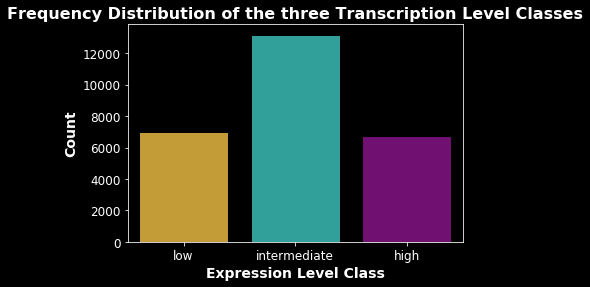

In [8]:
plt.style.use("dark_background")
plt.figure(figsize=(6,4))

sns.countplot(x="Expression_Level", data=df_CUB_metrics.sort_values(by="Expression_Level", ascending=False), 
              palette = ["goldenrod", "lightseagreen", "purple"], edgecolor='black')

plt.xlabel('Expression Level Class', fontsize=14, fontweight='bold')
plt.ylabel('Count', fontsize=14, fontweight='bold')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title("Frequency Distribution of the three Transcription Level Classes", fontsize=16, fontweight='bold')
plt.savefig('figures/frequency_distribution.png', dpi=300, bbox_inches="tight")
plt.show()

* Lastly, I will transform this target attribute to make our data more uniformly distributed. 

> This will prove benefitial also during the model training because our target variable contains a large spread of values. After transforming the dependent variable, loss functions that minimize square error will not be so strongly influeced by these large differences in the target values.

> Lets check the skewness of the data before and after transforming the data with some classical transformation methods.


In [12]:
def log_transformation(item):
    return np.log10(item) # 2

In [13]:
from scipy.special import boxcox, inv_boxcox

In [14]:
print("Skewness")
print("No Transformation")
print((df_CUB_metrics["Max TPM"]).skew())
print("====================================================")
print("Log Transformation")
print(df_CUB_metrics["Max TPM"].apply(log_transformation).skew())
print("====================================================")
print("Sqrt Transformation")
print(np.sqrt(df_CUB_metrics["Max TPM"]).skew())
print("====================================================")
print("BoxPlot Transformation")
print(boxcox(df_CUB_metrics["Max TPM"],0).skew())


Skewness
No Transformation
42.43609678303319
Log Transformation
-0.32885906497275275
Sqrt Transformation
7.141741566058186
BoxPlot Transformation
-0.3288590649727522


> We can observe how after transforming the data the skewness is decreased considerably after using log transformation.

> Before log transforming we should check that there are not 0 values in the dataset

In [15]:
df_CUB_metrics[df_CUB_metrics["Max TPM"] == 0]

,Gene ID,Gene Name,Max TPM,Transcript ID,Length,CDS sequence,CAI,Nc,TGT_RSCU(CYS),TGC_RSCU(CYS),GAT_RSCU(ASP),GAC_RSCU(ASP),TCT_RSCU(SER),TCG_RSCU(SER),TCA_RSCU(SER),TCC_RSCU(SER),AGC_RSCU(SER),AGT_RSCU(SER),CAA_RSCU(GLN),CAG_RSCU(GLN),ATG_RSCU(MET),AAC_RSCU(ASN),AAT_RSCU(ASN),CCT_RSCU(PRO),CCG_RSCU(PRO),CCA_RSCU(PRO),CCC_RSCU(PRO),AAG_RSCU(LYS),AAA_RSCU(LYS),ACC_RSCU(THR),ACA_RSCU(THR),ACG_RSCU(THR),ACT_RSCU(THR),TTT_RSCU(PHE),TTC_RSCU(PHE),GCA_RSCU(ALA),GCC_RSCU(ALA),GCG_RSCU(ALA),GCT_RSCU(ALA),GGT_RSCU(GLY),GGG_RSCU(GLY),GGA_RSCU(GLY),GGC_RSCU(GLY),ATC_RSCU(ILE),ATA_RSCU(ILE),ATT_RSCU(ILE),TTA_RSCU(LEU),TTG_RSCU(LEU),CTC_RSCU(LEU),CTT_RSCU(LEU),CTG_RSCU(LEU),CTA_RSCU(LEU),CAT_RSCU(HIS),CAC_RSCU(HIS),CGA_RSCU(ARG),CGC_RSCU(ARG),CGG_RSCU(ARG),CGT_RSCU(ARG),AGG_RSCU(ARG),AGA_RSCU(ARG),TGG_RSCU(TRP),GTA_RSCU(VAL),GTC_RSCU(VAL),GTG_RSCU(VAL),GTT_RSCU(VAL),GAG_RSCU(GLU),GAA_RSCU(GLU),TAT_RSCU(TYR),TAC_RSCU(TYR),GC%_Total,GC%_Pos1,GC%_Pos2,GC%_Pos3,Expression_Level,Max_TPM_Transformed,aa_sequence,perc_ala,perc_cys,Tissue


In [16]:
df_CUB_metrics["Max_TPM_Transformed"] = df_CUB_metrics["Max TPM"].apply(log_transformation)

In [17]:
df_CUB_metrics["Max_TPM_Transformed"].describe()

count    26865.000000
mean         1.392933
std          0.918773
min         -1.000000
25%          0.903090
50%          1.531479
75%          1.977724
max          5.040448
Name: Max_TPM_Transformed, dtype: float64

Lets check the data distribution of the `Max_TPM` values before and after the transformation:

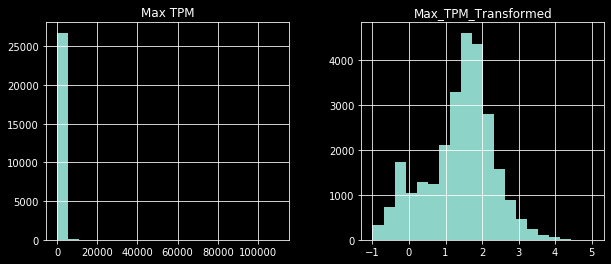

In [18]:
plt.style.use("dark_background")
plt.rcParams["figure.figsize"] = (10,4)
df_CUB_metrics[["Max TPM", "Max_TPM_Transformed"]].hist(bins=20)
plt.savefig("figures/log_transformation.png", dpi=300, bbox_inches="tight")
plt.show()

In [148]:
# Normality test

from scipy.stats import shapiro

# normality test
stat, p = shapiro(df_CUB_metrics["Max_TPM_Transformed"])
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
	print('Sample looks Gaussian (fail to reject H0)')
else:
	print('Sample does not look Gaussian (reject H0)')

Statistics=0.973, p=0.000
Sample does not look Gaussian (reject H0)


The target variable does not follow a normal distribution based on the shapiro test after the transformation, hence I will perform the stats with non-parametric tests on the set (i.e. mann-whitney, kruskal-wallis).

In [14]:
df_CUB_metrics.to_csv("data/df_cub_metrics.csv", index=False)

In [3]:
df_CUB_metrics = pd.read_csv("data/df_cub_metrics.csv")

In [4]:
df_CUB_metrics

,Gene ID,Gene Name,Max TPM,Transcript ID,Length,CDS sequence,CAI,Nc,TGT_RSCU(CYS),TGC_RSCU(CYS),GAT_RSCU(ASP),GAC_RSCU(ASP),TCT_RSCU(SER),TCG_RSCU(SER),TCA_RSCU(SER),TCC_RSCU(SER),AGC_RSCU(SER),AGT_RSCU(SER),CAA_RSCU(GLN),CAG_RSCU(GLN),ATG_RSCU(MET),AAC_RSCU(ASN),AAT_RSCU(ASN),CCT_RSCU(PRO),CCG_RSCU(PRO),CCA_RSCU(PRO),CCC_RSCU(PRO),AAG_RSCU(LYS),AAA_RSCU(LYS),ACC_RSCU(THR),ACA_RSCU(THR),ACG_RSCU(THR),ACT_RSCU(THR),TTT_RSCU(PHE),TTC_RSCU(PHE),GCA_RSCU(ALA),GCC_RSCU(ALA),GCG_RSCU(ALA),GCT_RSCU(ALA),GGT_RSCU(GLY),GGG_RSCU(GLY),GGA_RSCU(GLY),GGC_RSCU(GLY),ATC_RSCU(ILE),ATA_RSCU(ILE),ATT_RSCU(ILE),TTA_RSCU(LEU),TTG_RSCU(LEU),CTC_RSCU(LEU),CTT_RSCU(LEU),CTG_RSCU(LEU),CTA_RSCU(LEU),CAT_RSCU(HIS),CAC_RSCU(HIS),CGA_RSCU(ARG),CGC_RSCU(ARG),CGG_RSCU(ARG),CGT_RSCU(ARG),AGG_RSCU(ARG),AGA_RSCU(ARG),TGG_RSCU(TRP),GTA_RSCU(VAL),GTC_RSCU(VAL),GTG_RSCU(VAL),GTT_RSCU(VAL),GAG_RSCU(GLU),GAA_RSCU(GLU),TAT_RSCU(TYR),TAC_RSCU(TYR),GC%_Total,GC%_Pos1,GC%_Pos2,GC%_Pos3,Expression_Level,Max_TPM_Transformed,Tissue,aa_sequence,perc_ala,perc_cys
0,AT1G01010,NAC001,46.0,AT1G01010.1,1290,ATGGAGGATCAAGTTGGGTTTGGGTTCCGTCCGAACGACGAGGAGC...,0.231619,57.010,1.000,1.000,1.310,0.690,1.435,0.652,1.043,0.391,1.174,1.304,0.769,1.231,1.0,1.231,0.769,1.800,0.400,1.000,0.800,1.000,1.000,0.706,0.706,0.471,2.118,0.941,1.059,2.154,0.308,0.308,1.231,1.600,0.640,1.120,0.640,1.111,0.444,1.444,0.240,2.400,1.440,1.200,0.480,0.240,1.000,1.000,0.632,0.632,0.316,1.895,1.263,1.263,1.0,0.296,1.037,0.889,1.778,1.030,0.970,0.947,1.053,44.108527,48.837209,36.046512,47.441860,intermediate,1.662758,root,MEDQVGFGFRPNDEELVGHYLRNKIEGNTSRDVEVAISEVNICSYD...,3.02,0.93
1,AT1G01020,ARV1,27.0,AT1G01020.1,738,ATGGCGGCGAGTGAACACAGATGCGTGGGATGTGGTTTTAGGGTAA...,0.219198,54.313,0.750,1.250,1.667,0.333,2.286,0.286,1.143,0.571,0.857,0.857,1.200,0.800,1.0,0.750,1.250,0.667,1.333,2.000,0.000,1.400,0.600,0.571,1.714,0.000,1.714,1.111,0.889,1.333,0.800,1.333,0.533,2.222,0.444,1.333,0.000,0.857,0.750,1.393,0.706,1.941,0.529,1.235,0.882,0.706,0.400,1.600,0.000,0.429,0.000,0.429,0.429,4.714,1.0,1.333,1.111,0.889,0.667,0.667,1.333,1.111,0.889,38.753388,39.430894,33.739837,43.089431,intermediate,1.431364,root/leaf,MAASEHRCVGCGFRVKSLFIQYSPGNIRLMKCGNCKEVADEYIECE...,6.10,3.25
2,AT1G01030,NGA3,12.0,AT1G01030.1,1077,ATGGATCTATCCCTGGCTCCGACAACAACAACAAGTTCCGACCAAG...,0.230129,56.828,2.000,0.000,1.185,0.815,1.650,0.300,1.200,1.350,1.350,0.150,1.647,0.353,1.0,1.172,0.828,1.037,1.630,0.889,0.444,0.714,1.286,1.067,1.333,0.800,0.800,0.625,1.375,1.600,0.000,0.400,2.000,0.828,0.690,1.517,0.966,1.091,0.545,1.364,1.286,1.071,1.286,1.071,0.214,1.071,1.111,0.889,0.545,0.000,0.273,1.364,1.364,2.455,1.0,0.444,1.111,1.333,1.111,0.933,1.067,1.286,0.714,45.775302,49.303621,42.061281,45.961003,intermediate,1.079181,leaf,MDLSLAPTTTTSSDQEQDRDQELTSNIGASSSSGPSGNNNNLPMMM...,2.79,0.56
3,AT1G01040,DCL1,25.0,AT1G01040.2,5733,ATGGTAATGGAGGATGAGCCTAGAGAAGCCACAATAAAGCCTTCTT...,0.238449,50.620,1.257,0.743,1.518,0.482,1.671,0.600,1.414,0.386,0.771,1.157,1.162,0.838,1.0,0.842,1.158,2.234,0.571,0.779,0.416,0.978,1.022,0.350,1.700,0.750,1.200,1.304,0.696,1.014,0.423,0.676,1.887,1.531,0.812,1.219,0.438,0.846,0.654,1.500,0.786,1.286,0.679,2.214,0.429,0.607,1.318,0.682,0.667,0.111,0.444,0.778,1.778,2.222,1.0,0.428,0.403,0.956,2.214,1.104,0.896,1.143,0.857,43.764172,54.683412,38.199895,38.409210,intermediate,1.397940,leaf,MVMEDEPREATIKPSYWLDACEDISCDLIDDLVSEFDPSSVAVNES...,7.43,1.83
4,AT1G01050,PPA1,172.0,AT1G01050.1,639,ATGAGTGAAGAAACTAAAGATAACCAGAGGCTGCAGCGACCAGCTC...,0.230825,48.680,2.000,0.000,1.000,1.000,1.500,0.000,2.500,1.000,0.500,0.500,0.000,2.000,1.0,1.250,0.750,2.400,0.267,1.067,0.267,1.000,1.000,0.667,1.333,0.000,2.000,1.000,1.000,0.727,0.727,0.364,2.182,1.500,0.000,2.500,0.000,1.312,0.000,1.688,0.632,0.632,1.895,1.579,1.263,0.000,0.667,1.333,0.400,0.400,0.000,2.800,1.200,1.200,1.0,0.235,0.706,1.176,1.882,0.667,1.333,0.600,1.400,44.600939,56.807512,33.802817,43.192488,high,2.235528,root,MSEETKDNQRLQRPAPRLNERILSSLSRRSVAAHPWHDLEIGPGAP...,5.16,1.41

### **Step 2**: Exploratory Data Analyses and Feature selection

In this section I aim to better undestand how CUB-related features impact the transcription level of the genes of interest. For this I will generate some plots to get some insight into what factors seem to drive the differences at the transcription level.

> The main question:  Does CUB impact the transcription level of the genes of interest? and if so, how?

> The first thing we can do is to test if there are any statistical differences between high and low expression classes for each of the selected variables.

*Note: For this particular problem I decided to leave any posible outlier since, despite impacting negatively model performace, I think they may contain valuable biological information for the interpretation of the results*.

* Lets perform a **mannwhitney tests** between high and low transcription classes for all the variables to check their statistical significance. For this I defined a function to save the results into csv files under the folder statistical_tests.

In [19]:
# selecting the numeric variables and dropping the target variables (obviously those would be significant)

mannwhitney_list_variables = list(df_CUB_metrics.select_dtypes(include=["int64", "float"]).drop(["Max TPM","Max_TPM_Transformed"], axis=1).columns)

In [21]:
from metrics_calc import mannwhitney # custom function to generate the statistical tests beetween high and low classes.

for i in mannwhitney_list_variables:
    mannwhitney(df_CUB_metrics,i)

Lets combine all the csv files into one single file.

In [22]:
import glob
# getting the file paths list
file_paths = glob.glob('statistical_tests/*.csv')

In [23]:
#combine all files in the paths list
combined_csv = pd.concat([pd.read_csv(f) for f in file_paths])
#export to csv
combined_csv.to_csv("statistical_tests/all_tests_combined.csv", index=False, encoding='utf-8-sig') 

In [24]:
results_stats = pd.read_csv("statistical_tests/all_tests_combined.csv")

In [25]:
results_stats = results_stats.drop(["Unnamed: 0"], axis=1).sort_values(by="p")

In [26]:
results_stats.head()

,variable,Statistics,p,alpha,Interpretation
40,GC%_Total,12041166.5,0.000000e+00,0.05,Different distribution (reject H0)
37,GC%_Pos1,13288415.0,0.000000e+00,0.05,Different distribution (reject H0)
55,perc_ala,13435677.0,0.000000e+00,0.05,Different distribution (reject H0)
56,perc_cys,16603460.0,5.160605e-191,0.05,Different distribution (reject H0)
38,GC%_Pos2,17097318.0,1.438617e-164,0.05,Different distribution (reject H0)


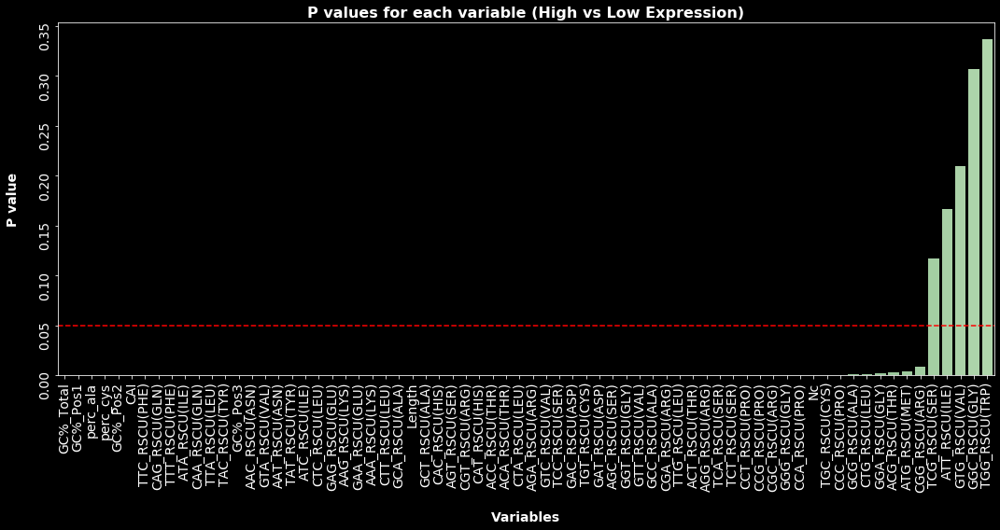

In [27]:
plt.style.use("dark_background")
plt.rcParams["figure.figsize"] = (15,8)
sns.barplot(x="variable",y="p", data=results_stats, palette="Greens_d")
plt.title("P values for each variable (High vs Low Expression)", fontsize=16, fontweight='bold')
plt.ylabel("P value", labelpad=20, fontsize=14, fontweight='bold')
plt.xlabel("Variables", labelpad=20, fontsize=14, fontweight='bold')
plt.xticks(rotation=90, fontsize=14)
plt.yticks(rotation=90, fontsize=14)
plt.axhline(y=0.05, color='r', linestyle='--')
plt.tight_layout()
plt.savefig("figures/p_values.png", dpi=400)
plt.show()

> The results from the t-test denote significant differences at the 5 % level between high and low expressed genes. **We will keep those parameters for the modeling**.

* **Principal Component Analysis (PCA)** of RSCUs in highly-expressed transcripts vs low-expressed genes. 

> Here I used the statistical method of PCA, which has been previously used classify and categorize variations in codon usage [[Ref]](https://www.biorxiv.org/content/10.1101/528083v1.full). This will allow us to visually inspect possible clusters and to check how many componenta are required to explain the variance among the RSCU values.

In [4]:
# Preparing the data taking the 64 RSCU values for the 200 genes with highest and lowest Max TPM

RSCUs_lowest_TPM = df_CUB_metrics.sort_values(by="Max TPM").iloc[:200,8:69]
gene_IDs_low = df_CUB_metrics.sort_values(by="Max TPM").iloc[:200,1:3]
RSCUs_lowest_TPM = pd.concat([gene_IDs_low , RSCUs_lowest_TPM], axis=1)

RSCUs_highest_TPM = df_CUB_metrics.sort_values(by="Max TPM").iloc[-200:,8:69]
gene_IDs_high = df_CUB_metrics.sort_values(by="Max TPM").iloc[-200:,1:3]
RSCUs_highest_TPM = pd.concat([gene_IDs_high , RSCUs_highest_TPM], axis=1)


In [5]:
RSCUs_lowest_TPM["Class"] = "Low"
RSCUs_highest_TPM["Class"] = "High"

In [6]:
# Concatenating the data
df_PCA = pd.concat([RSCUs_lowest_TPM, RSCUs_highest_TPM], axis=0)

In [7]:
df_PCA = df_PCA.reset_index(drop=True)

In [8]:
df_PCA.head()

,Gene Name,Max TPM,TGT_RSCU(CYS),TGC_RSCU(CYS),GAT_RSCU(ASP),GAC_RSCU(ASP),TCT_RSCU(SER),TCG_RSCU(SER),TCA_RSCU(SER),TCC_RSCU(SER),AGC_RSCU(SER),AGT_RSCU(SER),CAA_RSCU(GLN),CAG_RSCU(GLN),ATG_RSCU(MET),AAC_RSCU(ASN),AAT_RSCU(ASN),CCT_RSCU(PRO),CCG_RSCU(PRO),CCA_RSCU(PRO),CCC_RSCU(PRO),AAG_RSCU(LYS),AAA_RSCU(LYS),ACC_RSCU(THR),ACA_RSCU(THR),ACG_RSCU(THR),ACT_RSCU(THR),TTT_RSCU(PHE),TTC_RSCU(PHE),GCA_RSCU(ALA),GCC_RSCU(ALA),GCG_RSCU(ALA),GCT_RSCU(ALA),GGT_RSCU(GLY),GGG_RSCU(GLY),GGA_RSCU(GLY),GGC_RSCU(GLY),ATC_RSCU(ILE),ATA_RSCU(ILE),ATT_RSCU(ILE),TTA_RSCU(LEU),TTG_RSCU(LEU),CTC_RSCU(LEU),CTT_RSCU(LEU),CTG_RSCU(LEU),CTA_RSCU(LEU),CAT_RSCU(HIS),CAC_RSCU(HIS),CGA_RSCU(ARG),CGC_RSCU(ARG),CGG_RSCU(ARG),CGT_RSCU(ARG),AGG_RSCU(ARG),AGA_RSCU(ARG),TGG_RSCU(TRP),GTA_RSCU(VAL),GTC_RSCU(VAL),GTG_RSCU(VAL),GTT_RSCU(VAL),GAG_RSCU(GLU),GAA_RSCU(GLU),TAT_RSCU(TYR),TAC_RSCU(TYR),Class
0,AT4G05620,0.1,1.200,0.800,2.000,0.000,2.118,0.706,1.059,0.706,0.353,1.059,1.000,1.000,1.0,0.750,1.250,1.200,0.400,2.000,0.400,1.250,0.750,0.667,0.000,0.667,2.667,0.000,2.000,0.000,1.333,2.000,0.667,4.000,0.000,0.000,0.000,0.429,1.286,1.286,1.800,1.500,1.500,1.200,0.000,0.000,1.200,0.800,0.750,0.750,0.000,2.250,1.500,0.750,1.0,0.800,1.600,0.400,1.200,1.500,0.500,1.200,0.800,Low
1,AT2G37910,0.1,1.200,0.800,1.818,0.182,0.800,0.600,1.400,0.800,1.000,1.400,1.111,0.889,1.0,0.714,1.286,2.000,0.500,0.500,1.000,0.700,1.300,1.231,1.231,0.923,0.615,2.000,0.000,0.000,2.400,0.000,1.600,0.857,0.857,2.286,0.000,0.600,1.500,0.900,2.000,0.571,0.857,0.857,1.429,0.286,0.500,1.500,0.000,0.000,0.800,1.600,1.600,2.000,0.0,1.333,0.800,0.533,1.333,0.889,1.111,1.000,1.000,Low
2,AT3G43180,0.1,1.400,0.600,2.000,0.000,1.600,0.400,1.200,0.400,2.400,0.000,1.714,0.286,1.0,0.333,1.667,2.500,1.000,0.500,0.000,1.091,0.909,0.333,2.000,0.000,1.667,1.143,0.857,1.714,0.000,0.571,1.714,0.727,0.000,1.818,1.455,1.000,1.250,0.750,0.706,0.353,1.412,1.412,0.353,1.765,1.714,0.286,0.000,0.000,0.000,1.714,0.857,3.429,0.0,0.235,0.235,2.118,1.412,0.923,1.077,1.333,0.667,Low
3,LINC4,0.1,1.167,0.833,1.564,0.436,2.067,0.867,1.067,0.333,0.933,0.733,1.122,0.878,1.0,0.900,1.100,1.714,0.857,1.429,0.000,1.029,0.971,0.800,0.960,0.720,1.520,1.368,0.632,1.352,0.563,0.338,1.746,0.952,0.952,1.524,0.571,1.026,0.632,1.342,1.221,1.699,0.212,1.062,1.009,0.796,1.400,0.600,0.825,0.225,0.675,0.900,1.275,2.100,1.0,0.314,0.627,1.098,1.961,0.884,1.116,1.467,0.533,Low
4,AT1G70120,0.1,1.600,0.400,1.167,0.833,1.875,0.375,1.500,0.375,0.750,1.125,1.750,0.250,1.0,0.667,1.333,2.000,0.667,0.667,0.667,0.800,1.200,1.333,1.333,0.267,1.067,1.250,0.750,0.923,0.615,1.231,1.231,1.333,0.333,1.667,0.667,0.529,1.059,1.412,0.818,2.182,1.091,0.545,0.000,1.364,0.000,0.000,0.462,0.000,0.923,0.923,2.308,1.385,1.0,0.500,1.000,1.000,1.500,0.667,1.333,1.500,0.500,Low


In [9]:
# Selecting only the 61 RSCU columns for the PCA (We can perform the PCA with out standarizing the data since RSCU values are already normalized)
X_PCA = df_PCA.iloc[:,2:63]

In [10]:
# PCA
from sklearn.decomposition import PCA
pca = PCA(n_components = 2)
X2D = pca.fit_transform(X_PCA)

In [11]:
pca.explained_variance_ratio_

array([0.12490547, 0.07520626])

> The first component can explain the 12% of the variance, whereas the second component explains 8%.

How many components are needed to explain 95% of the variance?

In [12]:
# This code gives us the number of dimensions require to explain 95% of the variance
pca = PCA()
pca.fit(X_PCA)
cumsum = np.cumsum(pca.explained_variance_ratio_) # cummulative sum
d = np.argmax(cumsum >= 0.95) + 1

In [13]:
d

39

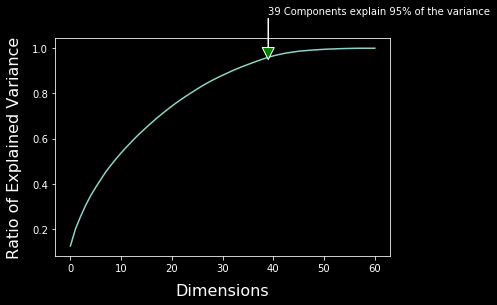

In [14]:
plt.style.use("dark_background")
plt.plot(cumsum) # We observe that most of variance is attributed to a single dimension
plt.xlabel("Dimensions", labelpad=10, fontsize=16)
plt.ylabel("Ratio of Explained Variance", labelpad=10, fontsize=16)
x_95 = 39
y_95 = 0.95
plt.annotate(s = "39 Components explain 95% of the variance", xy=(x_95,y_95), xytext=(x_95, y_95 + 0.2),
           arrowprops=dict(facecolor='green', width=0.02))
#plt.savefig("figures/explanation_variance_PCA.png", dpi=300, bbox_inches="tight")
plt.show()

> In the plot above We can see how 39 values are needed to explain 95% of the variance. At large part of the 61 codons appear to contribute to the differences among genes in codon usage bias.

In [15]:
X2D = pd.DataFrame(X2D)

In [16]:
df_cols = pd.DataFrame(df_PCA[["Gene Name", "Max TPM", "Class"]])

In [17]:
plot_PCA = pd.concat([X2D,df_cols], axis=1) # Creating the df for the PCA plot

In [18]:
plot_PCA.columns = ["Component1", "Component2", "Gene Name", "Max TPM", "Class"]

In [19]:
plot_PCA

,Component1,Component2,Gene Name,Max TPM,Class
0,-0.529683,1.035288,AT4G05620,0.1,Low
1,0.754724,0.400994,AT2G37910,0.1,Low
2,1.655036,0.071224,AT3G43180,0.1,Low
3,1.473148,-0.257314,LINC4,0.1,Low
4,0.938316,-0.101165,AT1G70120,0.1,Low
...,...,...,...,...,...
395,1.628313,4.205498,RPL32,55776.0,High
396,1.216378,2.252963,RBCL,63824.0,High
397,0.595961,3.062493,PSBA,73683.0,High
398,0.120667,-0.954414,AT3G44935,81085.0,High


In the interactive plot we can hoover over the different data points to inspect Gene ID and Max TPM. Every Dot represents a gene.

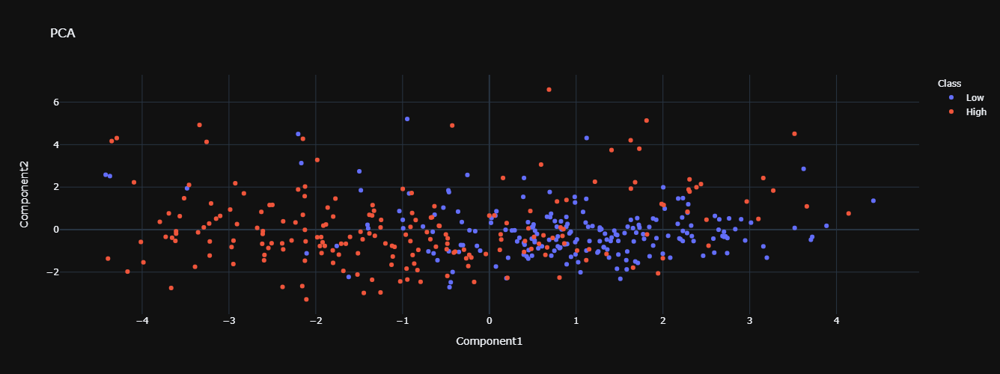

In [20]:
fig = px.scatter(plot_PCA,
                 title="PCA",
                 x="Component1", 
                 y="Component2", 
                 size_max=10,
                 hover_name = "Gene Name",
                hover_data=["Gene Name", "Max TPM"],
                color="Class",
                template="plotly_dark",
                 width=500, height=500)
fig.show()

> This plot indicates that, that high and low expressed genes cannot be clearly clustered based on only 2 components, indicating that the differences in CUB involve multiple codons.

Next I use other popular choices for dimensionality reduction such **t-SNE, LLE and MDS**. This could be useful to generate good candidate features for the model training:

In [74]:
# t-SNE 
from sklearn import manifold
from sklearn.manifold import LocallyLinearEmbedding
from sklearn.manifold import MDS

tsne = manifold.TSNE(n_components=2, random_state=42) # Method 1
X2D_tsne = tsne.fit_transform(X_PCA)

lle = LocallyLinearEmbedding(n_components=2, n_neighbors=20) # Method 2
X2D_lle = lle.fit_transform(X_PCA)

mds = MDS(n_components=2, random_state=42) # Method 3
X2D_mds = mds.fit_transform(X_PCA)

In [75]:
X2D_tsne = pd.DataFrame(X2D_tsne)
X2D_lle = pd.DataFrame(X2D_lle)
X2D_mds = pd.DataFrame(X2D_mds)

In [76]:
high_low_class = pd.DataFrame(df_PCA[["Class"]])

In [77]:
plot_tsne  = pd.concat([X2D_tsne, high_low_class ], axis=1) # creating the df for the plot
plot_lle  = pd.concat([X2D_lle, high_low_class ], axis=1)
plot_mds  = pd.concat([X2D_mds, high_low_class ], axis=1)

In [78]:
plot_tsne.columns = ["Component1", "Component2", "Class"]
plot_lle.columns = ["Component1", "Component2", "Class"]
plot_mds.columns = ["Component1", "Component2", "Class"]

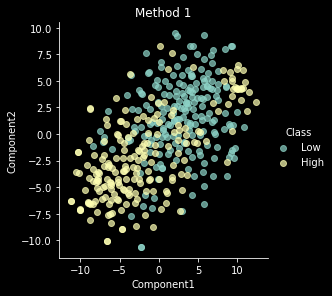

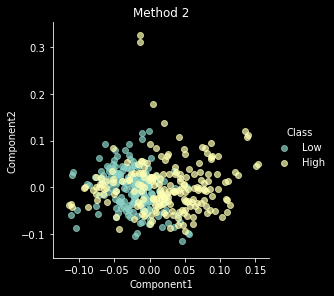

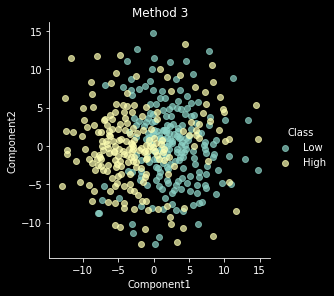

In [79]:
list_of_dfs = [plot_tsne, plot_lle, plot_mds]
for i in range(len(list_of_dfs)):
    grid = sns.FacetGrid(list_of_dfs[i], hue="Class", height=4)
    grid.map(plt.scatter, "Component1", "Component2", alpha=0.7).add_legend()
    plt.title("Method {}".format(i+1))
    plt.savefig("figures/dimensionality_reduction_method{}.png".format(i), dpi=300, bbox_inches="tight")

Unfortunately, as we can see, the first and second components of 61-dimension RSCU could not explain a large portion of the variance with any of the algorithms tested.

Overall, the unsupervised clustering techniques reflect that multiples codons are responsable for the differences in CUB.

* **Heat-map of RSCU values of high, intermediate and low expression groups**.

> I will use a heat map to illustrate the difference in codon usage between highly expressed genes and low expressed genes. 

> We could expect to see a pattern of codon usage among genes with similar transcription levels

> Furthermore, we should see larger variations in the RSCUs values in high expressed genes compared to low expressed genes, since high expressed genes are subjeted to higher evolutionary forces that lead to not random codon usage.

In [209]:
# Prepare data 1000 highly-expressed genes
RSCUs_highest = df_CUB_metrics.sort_values(by="Max TPM").iloc[-1000:,:] # getting the top most expressed genes
RSCUs_highest = RSCUs_highest.sort_values(by=["Max TPM"], ascending=False) # ordering the from highest to lowest
RSCUs_highest = RSCUs_highest.iloc[:,8:69] # Selecting the RSCU columns

In [208]:
RSCUs_intermediate = df_CUB_metrics.sort_values(by="Max TPM").iloc[12932:13932,:] # getting the 1000 intermediate genes
RSCUs_intermediate.sort_values(by=["Max TPM"], ascending=False) # ordering the from highest to lowest
RSCUs_intermediate = RSCUs_intermediate.iloc[:,8:69] # Selecting only the RSCU columns

In [210]:
# Prepare data 1000 intermediate-expressed genes
RSCUs_lowest = df_CUB_metrics.sort_values(by="Max TPM").iloc[:1000,:] # getting the least most expressed genes
RSCUs_lowest = RSCUs_lowest.sort_values(by=["Max TPM"], ascending=False) # ordering the from highest to lowest
RSCUs_lowest = RSCUs_lowest.iloc[:,8:69] # Selecting only the RSCU columns

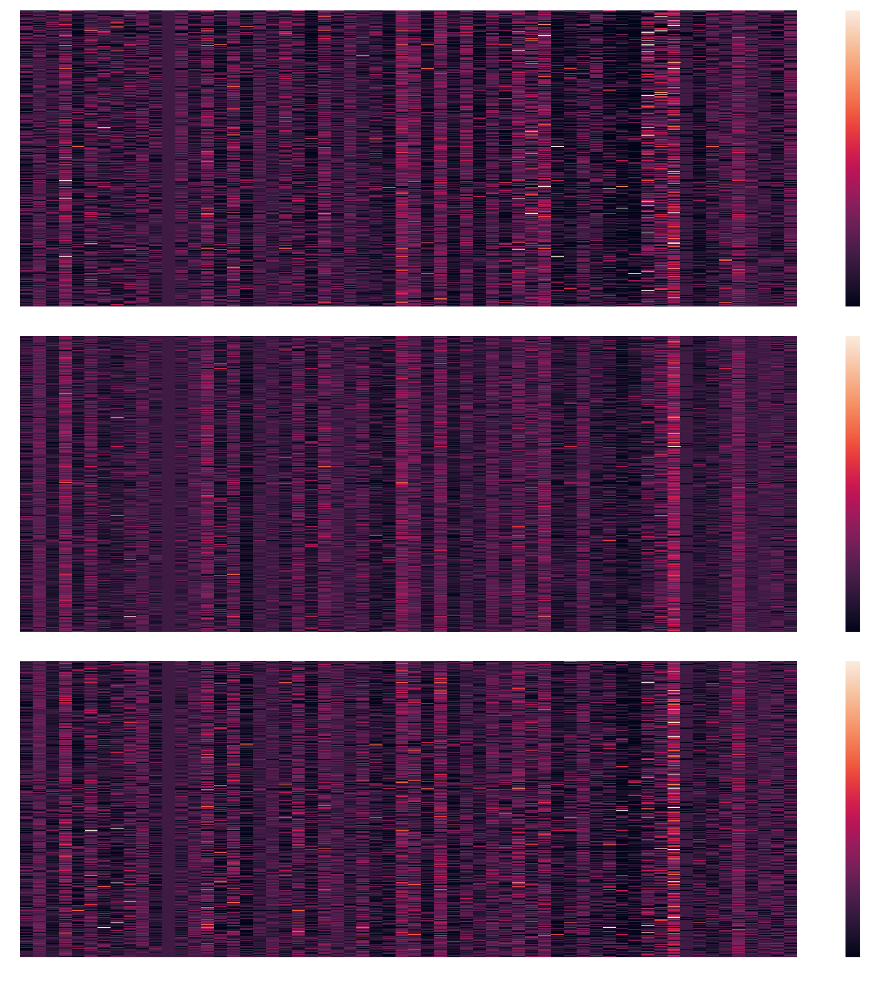

In [212]:
fig, (ax1, ax2, ax3) = plt.subplots(3,1, figsize=(40, 40), sharex=True, gridspec_kw={"hspace":0.1})

sns.heatmap(RSCUs_highest.iloc[:,1:], vmin=0, vmax=6, ax=ax1)
ax1.set_title("RSCU of Highly Expressed Genes",  fontsize=16, fontweight='bold')
sns.heatmap(RSCUs_intermediate.iloc[:,1:], vmin=0, vmax=6,  ax=ax2)
ax2.set_title("RSCU of Intermediate Expressed Genes", fontsize=16, fontweight='bold')
sns.heatmap(RSCUs_lowest.iloc[:,1:], vmin=0, vmax=6,  ax=ax3)
ax3.set_title("RSCU of Lowest Expressed Genes", fontsize=14, fontweight='bold')
plt.savefig("figures/heat_plot_RSCU_2000.png", dpi=400, bbox_inches="tight")
plt.show()

> Intermediate and low expression genes share a lot of common RSCU patterns. In highly expressed genes we observe some more pronounce differences in CUB. Nevertheless, the differences are rather subtle. In further analyses we will try to identify the most important codons in regards to their effect on the expression level.

* **Circular Diagram  of codon usage**. 

For this I will count the codons for high and low classes, and compare the differences in codon usage between both groups.

In [114]:
df_CUB_metrics = pd.read_csv("data/df_cub_metrics.csv")

In [35]:
# Preparing the data for the plot. Here I include the columns Gene Id and the CDS sequence for the high and low classes

count_high = df_CUB_metrics.loc[(df_CUB_metrics["Expression_Level"]=="high")][["Gene ID", "CDS sequence", "Length"]].reset_index(drop=True)

count_low = df_CUB_metrics.loc[(df_CUB_metrics["Expression_Level"]=="low")][["Gene ID", "CDS sequence", "Length"]].reset_index(drop=True)

In [17]:
count_high.shape[0]

6723

In [18]:
count_low.shape[0]

6964

In [19]:
# Use Count_Codons function to count the codons for each gene
from metrics_calc import Count_Codons

count_high["Codon_counts"] = count_high["CDS sequence"].apply(lambda x: Count_Codons(x))
count_low["Codon_counts"] = count_low["CDS sequence"].apply(lambda x: Count_Codons(x))

Next I will use the codon index to merge all the data from each gene. (Similarrly to what I did with the RSCU data)

In [20]:
# I will use this index to merge all the df generated for each codon
df_codon_index = pd.DataFrame(
        ['TGT', 'TGC', 'GAT', 'GAC', 'TCT', 'TCG', 'TCA', 'TCC', 'AGC', 'AGT',
       'CAA', 'CAG', 'ATG', 'AAC', 'AAT', 'CCT', 'CCG', 'CCA', 'CCC', 'AAG',
       'AAA', 'ACC', 'ACA', 'ACG', 'ACT', 'TTT', 'TTC', 'GCA', 'GCC', 'GCG',
       'GCT', 'GGT', 'GGG', 'GGA', 'GGC', 'ATC', 'ATA', 'ATT', 'TTA', 'TTG',
       'CTC', 'CTT', 'CTG', 'CTA', 'CAT', 'CAC', 'CGA', 'CGC', 'CGG', 'CGT',
       'AGG', 'AGA', 'TGG', 'GTA', 'GTC', 'GTG', 'GTT', 'GAG', 'GAA', 'TAT',
       'TAC'], columns=["index"]
)

In [21]:
# Using a for loop to make a list of dfs. Each df containing the values for each of the 61 codons

high_dfs = []
n=0
for i in range(len(count_high["Codon_counts"])):
    if  n % 300 == 0: # Append an index column every 300 dfs which will be used later to merge the dfs in chunks on the index column
        high_dfs.append(df_codon_index)
        df = pd.DataFrame.from_dict(count_high["Codon_counts"][i], orient='index', columns=["{}".format(i)]).reset_index()
        high_dfs.append(df)
        n+=1
    else: 
        df = pd.DataFrame.from_dict(count_high["Codon_counts"][i], orient='index', columns=["{}".format(i)]).reset_index()
        high_dfs.append(df)
        n+=1

In [22]:
# I will use chucks of size 300 dfs to speed-up the process of merging all the dfs

from functools import reduce

def chunks(lst, n):
    """Yield successive n-sized chunks from lst."""
    for i in range(0, len(lst), n):
        yield lst[i:i + n]

df_merged_chunks = []

for chunk in chunks(high_dfs, 300):
    df = reduce(lambda  left, right: pd.merge(left,right,on=["index"],
                                            how='outer'), chunk) 
    df_merged_chunks.append(df)
    

In [23]:
# merging all the merged chunks

df_merged = reduce(lambda  left, right: pd.merge(left,right,on=["index"],
                                            how='outer'), df_merged_chunks) 

In [24]:
df_merged = df_merged.set_index("index").T # Transposing the df 

In [25]:
# Now we can simply use the sum function and divide by the total number of genes to get the codon count for each codon

high_expr_counts = pd.DataFrame(round(df_merged.sum()/count_high.shape[0],2), columns=["Codon_Count"])

In [26]:
# We do the same for low

low_dfs = []
n=0
for i in range(len(count_low["Codon_counts"])):
    if  n % 300 == 0: # Append an index column every 300 dfs which will be used later to merge the dfs in chunks on the index column
        low_dfs.append(df_codon_index)
        df = pd.DataFrame.from_dict(count_low["Codon_counts"][i], orient='index', columns=["{}".format(i)]).reset_index()
        low_dfs.append(df)
        n+=1
    else: 
        df = pd.DataFrame.from_dict(count_low["Codon_counts"][i], orient='index', columns=["{}".format(i)]).reset_index()
        low_dfs.append(df)
        n+=1

In [27]:
# I will use chucks of size 300 dfs to speed-up the process of merging all the dfs


df_merged_chunks = []

for chunk in chunks(low_dfs, 300):
    df = reduce(lambda  left, right: pd.merge(left,right,on=["index"],
                                            how='outer'), chunk) 
    df_merged_chunks.append(df)
    

In [28]:
# merging all the merged chunks

df_merged = reduce(lambda  left, right: pd.merge(left,right,on=["index"],
                                            how='outer'), df_merged_chunks) 

In [29]:
df_merged = df_merged.set_index("index").T # Transposing the df 

In [30]:
# Now we can simply use the sum function and divide by the total number of genes to get the codon count for each codon

low_expr_counts = pd.DataFrame(round(df_merged.sum()/count_low.shape[0],2), columns=["Codon_Count"])

In [31]:
#  deleting those variables not needed to save memory

import gc

del [[df_merged, df_merged_chunks, high_dfs, low_dfs]] 
gc.collect()


66

As a result we obtain two dataframes with the average codon_count for high and low expression level gene classes

In [33]:
high_expr_counts.head()

,Codon_Count
index,
TGT,3.36
TGC,2.45
GAT,12.98
GAC,6.67
TCT,8.93


In [203]:
low_expr_counts.head()

,Codon_Count
index,
TGT,4.79
TGC,3.04
GAT,12.43
GAC,5.70
TCT,8.21


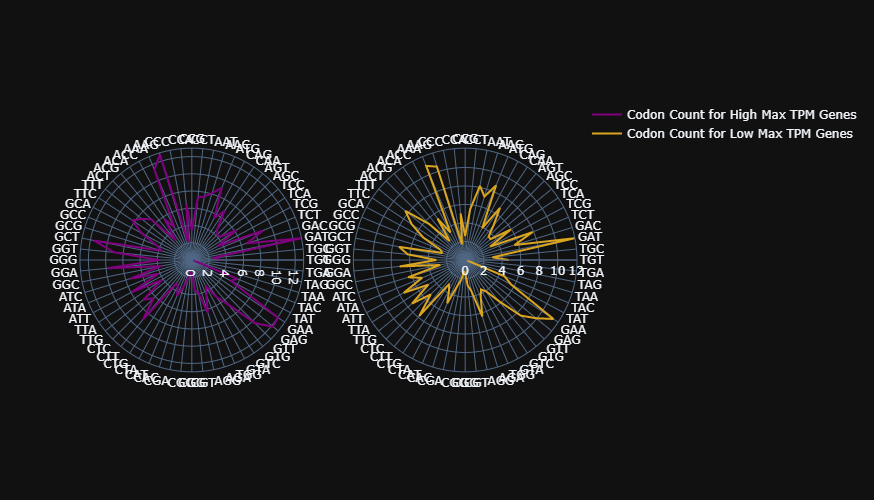

In [42]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

fig = make_subplots(rows=1, cols=2, specs=[[{'type': 'polar'},    {'type': 'polar'}]])


fig.add_traces(
    [go.Scatterpolar(r=high_expr_counts.Codon_Count, theta = high_expr_counts.index, name="Codon Count for High Max TPM Genes", line_color ="purple"),
     go.Scatterpolar(r=low_expr_counts.Codon_Count, theta = low_expr_counts.index, name="Codon Count for Low Max TPM Genes",  line_color="goldenrod")],
     rows=[1, 1],
    cols=[1, 2]
) 
fig.update_layout(height=500, width=1000, template='plotly_dark')
fig.show()

This plot shows the codon count. But If we want to look at the **codon frequency**, we should divide by the average length of the genes for each expression class. Lets do that next.

In [46]:
# dividing the codon count per the average gene length for the high class
high_expr_counts["Codon_Count_Per_Nt"] = high_expr_counts["Codon_Count"]/(count_high["Length"].mean()) 

In [47]:
# dividing the codon count per the average gene length for the low class
low_expr_counts["Codon_Count_Per_Nt"] = low_expr_counts["Codon_Count"]/(count_low["Length"].mean()) 

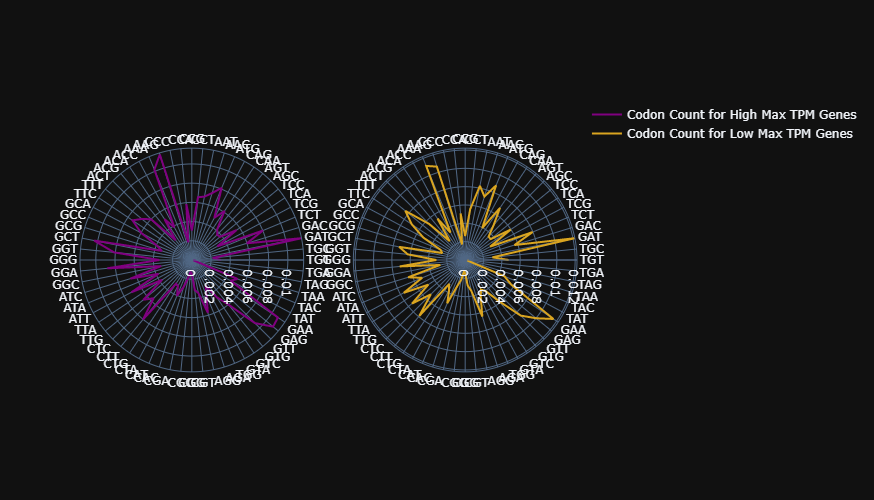

In [48]:
# Lets plot the Codon Frequency

import plotly.graph_objects as go
from plotly.subplots import make_subplots

fig = make_subplots(rows=1, cols=2, specs=[[{'type': 'polar'},    {'type': 'polar'}]])


fig.add_traces(
    [go.Scatterpolar(r=high_expr_counts.Codon_Count_Per_Nt, theta = high_expr_counts.index, name="Codon Frequency for High Expression Genes", line_color ="purple"),
     go.Scatterpolar(r=low_expr_counts.Codon_Count_Per_Nt, theta = low_expr_counts.index, name="Codon Frequency for Low Expression Genes",  line_color="goldenrod")],
     rows=[1, 1],
    cols=[1, 2]
) 
fig.update_layout(height=500, width=1000, template='plotly_dark')
fig.show()

In [55]:
perc_diff_High = pd.concat([high_expr_counts["Codon_Count_Per_Nt"], low_expr_counts["Codon_Count_Per_Nt"]], axis=1)
perc_diff_High.columns = ["Codon_Count_Per_Nt_High","Codon_Count_Per_Nt_Low"]
perc_diff_High["% Difference"] = round(((perc_diff_High["Codon_Count_Per_Nt_High"]/perc_diff_High["Codon_Count_Per_Nt_Low"])-1)*100,2)

In [59]:
perc_diff_High.sort_values(by="% Difference", ascending =False)[:3]

,Codon_Count_Per_Nt_High,Codon_Count_Per_Nt_Low,% Difference
index,,,
GCT,0.010373,0.007349,41.14
GCC,0.003957,0.002907,36.11
GGT,0.008147,0.006299,29.34


In [57]:
perc_diff_Low = pd.concat([low_expr_counts["Codon_Count_Per_Nt"], high_expr_counts["Codon_Count_Per_Nt"]], axis=1)
perc_diff_Low.columns = ["Codon_Count_Per_Nt_Low", "Codon_Count_Per_Nt_High"]
perc_diff_Low["% Difference"] = round(((perc_diff_High["Codon_Count_Per_Nt_Low"]/perc_diff_High["Codon_Count_Per_Nt_High"])-1)*100,2)

In [58]:
perc_diff_Low.sort_values(by="% Difference", ascending =False)[:3]

,Codon_Count_Per_Nt_Low,Codon_Count_Per_Nt_High,% Difference
index,,,
TGT,0.004745,0.003015,57.37
TAG,0.000232,0.000162,43.76
TGC,0.002998,0.002198,36.38


-- **GCT(Ala), GCC(Ala), GGT(Gly)**: Interestingly these codons increase in frequency in genes with high transcription levels.


-- **TGT(Cys), TGC(Cys)**: The abundance of cys seem to be associated with lower expression levels.

> Hence, It appears that the **content of ala and cys** are good candidates for the prediction of transcription level. Next I calculate those features.

> Furthermore, these results suggest that the GC content can be also a good indicator for the transcription level. 

> In the next section I will check the correlation of these features with the target variable `Max TPM`

In [61]:
# Adding to the data set the ala and cys content to test their simingly association with the transcription level of the genes

from sequence_utils import translate
from metrics_calc import perc_of_ala, perc_of_cys


df_CUB_metrics["aa_sequence"] = df_CUB_metrics["CDS sequence"].apply(translate)
df_CUB_metrics["perc_ala"] = df_CUB_metrics["aa_sequence"].apply(perc_of_ala)
df_CUB_metrics["perc_cys"] = df_CUB_metrics["aa_sequence"].apply(perc_of_cys)

In [63]:
df_CUB_metrics.to_csv("data/df_cub_metrics.csv", index=False)

In [3]:
df_CUB_metrics = pd.read_csv("data/df_cub_metrics.csv")

In [62]:
df_CUB_metrics.head()

,Gene ID,Gene Name,Max TPM,Transcript ID,Length,CDS sequence,CAI,Nc,TGT_RSCU(CYS),TGC_RSCU(CYS),GAT_RSCU(ASP),GAC_RSCU(ASP),TCT_RSCU(SER),TCG_RSCU(SER),TCA_RSCU(SER),TCC_RSCU(SER),AGC_RSCU(SER),AGT_RSCU(SER),CAA_RSCU(GLN),CAG_RSCU(GLN),ATG_RSCU(MET),AAC_RSCU(ASN),AAT_RSCU(ASN),CCT_RSCU(PRO),CCG_RSCU(PRO),CCA_RSCU(PRO),CCC_RSCU(PRO),AAG_RSCU(LYS),AAA_RSCU(LYS),ACC_RSCU(THR),ACA_RSCU(THR),ACG_RSCU(THR),ACT_RSCU(THR),TTT_RSCU(PHE),TTC_RSCU(PHE),GCA_RSCU(ALA),GCC_RSCU(ALA),GCG_RSCU(ALA),GCT_RSCU(ALA),GGT_RSCU(GLY),GGG_RSCU(GLY),GGA_RSCU(GLY),GGC_RSCU(GLY),ATC_RSCU(ILE),ATA_RSCU(ILE),ATT_RSCU(ILE),TTA_RSCU(LEU),TTG_RSCU(LEU),CTC_RSCU(LEU),CTT_RSCU(LEU),CTG_RSCU(LEU),CTA_RSCU(LEU),CAT_RSCU(HIS),CAC_RSCU(HIS),CGA_RSCU(ARG),CGC_RSCU(ARG),CGG_RSCU(ARG),CGT_RSCU(ARG),AGG_RSCU(ARG),AGA_RSCU(ARG),TGG_RSCU(TRP),GTA_RSCU(VAL),GTC_RSCU(VAL),GTG_RSCU(VAL),GTT_RSCU(VAL),GAG_RSCU(GLU),GAA_RSCU(GLU),TAT_RSCU(TYR),TAC_RSCU(TYR),GC%_Total,GC%_Pos1,GC%_Pos2,GC%_Pos3,Expression_Level,Max_TPM_Transformed,Tissue,aa_sequence,perc_ala,perc_cys
0,AT1G01010,NAC001,46.0,AT1G01010.1,1290,ATGGAGGATCAAGTTGGGTTTGGGTTCCGTCCGAACGACGAGGAGC...,0.231619,57.010,1.000,1.000,1.310,0.690,1.435,0.652,1.043,0.391,1.174,1.304,0.769,1.231,1.0,1.231,0.769,1.800,0.400,1.000,0.800,1.000,1.000,0.706,0.706,0.471,2.118,0.941,1.059,2.154,0.308,0.308,1.231,1.600,0.640,1.120,0.640,1.111,0.444,1.444,0.240,2.400,1.440,1.200,0.480,0.240,1.000,1.000,0.632,0.632,0.316,1.895,1.263,1.263,1.0,0.296,1.037,0.889,1.778,1.030,0.970,0.947,1.053,44.108527,48.837209,36.046512,47.441860,intermediate,1.662758,root,MEDQVGFGFRPNDEELVGHYLRNKIEGNTSRDVEVAISEVNICSYD...,3.02,0.93
1,AT1G01020,ARV1,27.0,AT1G01020.1,738,ATGGCGGCGAGTGAACACAGATGCGTGGGATGTGGTTTTAGGGTAA...,0.219198,54.313,0.750,1.250,1.667,0.333,2.286,0.286,1.143,0.571,0.857,0.857,1.200,0.800,1.0,0.750,1.250,0.667,1.333,2.000,0.000,1.400,0.600,0.571,1.714,0.000,1.714,1.111,0.889,1.333,0.800,1.333,0.533,2.222,0.444,1.333,0.000,0.857,0.750,1.393,0.706,1.941,0.529,1.235,0.882,0.706,0.400,1.600,0.000,0.429,0.000,0.429,0.429,4.714,1.0,1.333,1.111,0.889,0.667,0.667,1.333,1.111,0.889,38.753388,39.430894,33.739837,43.089431,intermediate,1.431364,root/leaf,MAASEHRCVGCGFRVKSLFIQYSPGNIRLMKCGNCKEVADEYIECE...,6.10,3.25
2,AT1G01030,NGA3,12.0,AT1G01030.1,1077,ATGGATCTATCCCTGGCTCCGACAACAACAACAAGTTCCGACCAAG...,0.230129,56.828,2.000,0.000,1.185,0.815,1.650,0.300,1.200,1.350,1.350,0.150,1.647,0.353,1.0,1.172,0.828,1.037,1.630,0.889,0.444,0.714,1.286,1.067,1.333,0.800,0.800,0.625,1.375,1.600,0.000,0.400,2.000,0.828,0.690,1.517,0.966,1.091,0.545,1.364,1.286,1.071,1.286,1.071,0.214,1.071,1.111,0.889,0.545,0.000,0.273,1.364,1.364,2.455,1.0,0.444,1.111,1.333,1.111,0.933,1.067,1.286,0.714,45.775302,49.303621,42.061281,45.961003,intermediate,1.079181,leaf,MDLSLAPTTTTSSDQEQDRDQELTSNIGASSSSGPSGNNNNLPMMM...,2.79,0.56
3,AT1G01040,DCL1,25.0,AT1G01040.2,5733,ATGGTAATGGAGGATGAGCCTAGAGAAGCCACAATAAAGCCTTCTT...,0.238449,50.620,1.257,0.743,1.518,0.482,1.671,0.600,1.414,0.386,0.771,1.157,1.162,0.838,1.0,0.842,1.158,2.234,0.571,0.779,0.416,0.978,1.022,0.350,1.700,0.750,1.200,1.304,0.696,1.014,0.423,0.676,1.887,1.531,0.812,1.219,0.438,0.846,0.654,1.500,0.786,1.286,0.679,2.214,0.429,0.607,1.318,0.682,0.667,0.111,0.444,0.778,1.778,2.222,1.0,0.428,0.403,0.956,2.214,1.104,0.896,1.143,0.857,43.764172,54.683412,38.199895,38.409210,intermediate,1.397940,leaf,MVMEDEPREATIKPSYWLDACEDISCDLIDDLVSEFDPSSVAVNES...,7.43,1.83
4,AT1G01050,PPA1,172.0,AT1G01050.1,639,ATGAGTGAAGAAACTAAAGATAACCAGAGGCTGCAGCGACCAGCTC...,0.230825,48.680,2.000,0.000,1.000,1.000,1.500,0.000,2.500,1.000,0.500,0.500,0.000,2.000,1.0,1.250,0.750,2.400,0.267,1.067,0.267,1.000,1.000,0.667,1.333,0.000,2.000,1.000,1.000,0.727,0.727,0.364,2.182,1.500,0.000,2.500,0.000,1.312,0.000,1.688,0.632,0.632,1.895,1.579,1.263,0.000,0.667,1.333,0.400,0.400,0.000,2.800,1.200,1.200,1.0,0.235,0.706,1.176,1.882,0.667,1.333,0.600,1.400,44.600939,56.807512,33.802817,43.192488,high,2.235528,root,MSEETKDNQRLQRPAPRLNERILSSLSRRSVAAHPWHDLEIGPGAP...,5.16,1.41

* To further inspect the patterns in the RSCU values I will also create scatter polar plot to inspect differences among the three transcription levels:

In [67]:
RSCUs_columns = list(df_CUB_metrics.columns[8:69])

In [79]:
RSCUs_means = pd.pivot_table(data = df_CUB_metrics, index=["Expression_Level"],
         values= RSCUs_columns, 
        aggfunc = "mean").reset_index()

In [81]:
RSCUs_means = RSCUs_means.T.reset_index()

In [82]:
RSCUs_means["index"] = RSCUs_means["index"].str.split("_", expand=True)[0]

In [85]:
RSCUs_means = RSCUs_means.set_index("index")

In [90]:
RSCUs_means = RSCUs_means.iloc[1:,:]

In [91]:
RSCUs_means.columns = ["High", "Intermediate", "Low"]

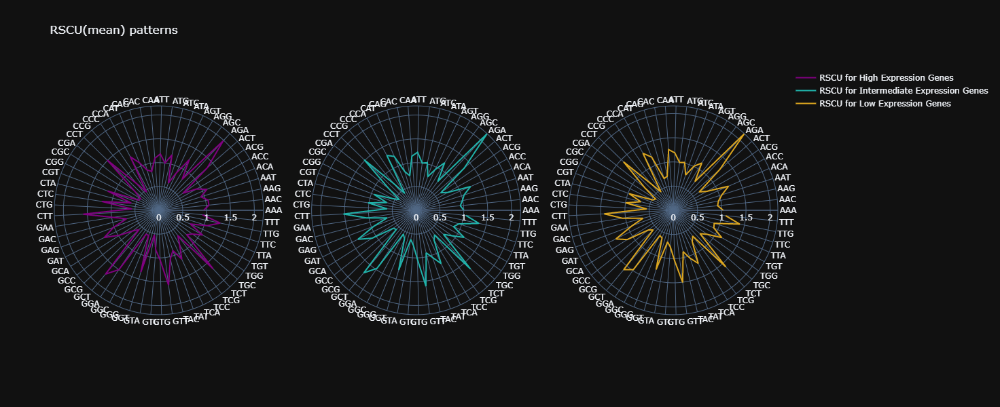

In [120]:
# Lets plot the Codon Frequency

import plotly.graph_objects as go
from plotly.subplots import make_subplots

fig = make_subplots(rows=1, cols=3, specs=[[{'type': 'polar'}, {'type': 'polar'}, {'type': 'polar'}]])


fig.add_traces(
    [go.Scatterpolar(r=RSCUs_means.High, theta = RSCUs_means.index, name="RSCU for High Expression Genes", line_color ="purple"),
     go.Scatterpolar(r=RSCUs_means.Intermediate, theta = RSCUs_means.index, name="RSCU for Intermediate Expression Genes",  line_color="lightseagreen"),
    go.Scatterpolar(r=RSCUs_means.Low, theta = RSCUs_means.index, name="RSCU for Low Expression Genes",  line_color="goldenrod")],
     rows=[1, 1, 1],
    cols=[1, 2, 3]
) 
fig.update_layout(height=600, width=1400, template='plotly_dark', polar=dict(
    radialaxis=dict(visible=True, range=[0,2.19])),
    title='RSCU(mean) patterns')
    
fig.show()

* Perform a **mannwhitney tests** between high and low transcription classes for all the variables once again to include the newly generated features.

In [28]:
# selecting the numeric variables and dropping the target variables (obviously those would be significant)

mannwhitney_list_variables = list(df_CUB_metrics.select_dtypes(include=["int64", "float"]).drop(["Max TPM","Max_TPM_Transformed"], axis=1).columns)

In [29]:
from metrics_calc import mannwhitney # custom function to generate the statistical tests beetween high and low classes.

for i in mannwhitney_list_variables:
    mannwhitney(df_CUB_metrics,i)

Lets combine all the csv files into one single file.

In [30]:
import glob
# getting the file paths list
file_paths = glob.glob('statistical_tests/*.csv')

In [31]:
#combine all files in the paths list
combined_csv = pd.concat([pd.read_csv(f) for f in file_paths])
#export to csv
combined_csv.to_csv("statistical_tests/all_tests_combined.csv", index=False, encoding='utf-8-sig') 

In [32]:
results_stats = pd.read_csv("statistical_tests/all_tests_combined.csv")

In [33]:
results_stats = results_stats.drop_duplicates(subset=["variable"]) # some duplicates were created after running twice the code

In [34]:
results_stats = results_stats.drop(["Unnamed: 0"], axis=1).reset_index(drop=True).sort_values(by="p")

In [35]:
results_stats.to_csv("statistical_tests/all_tests_combined.csv")

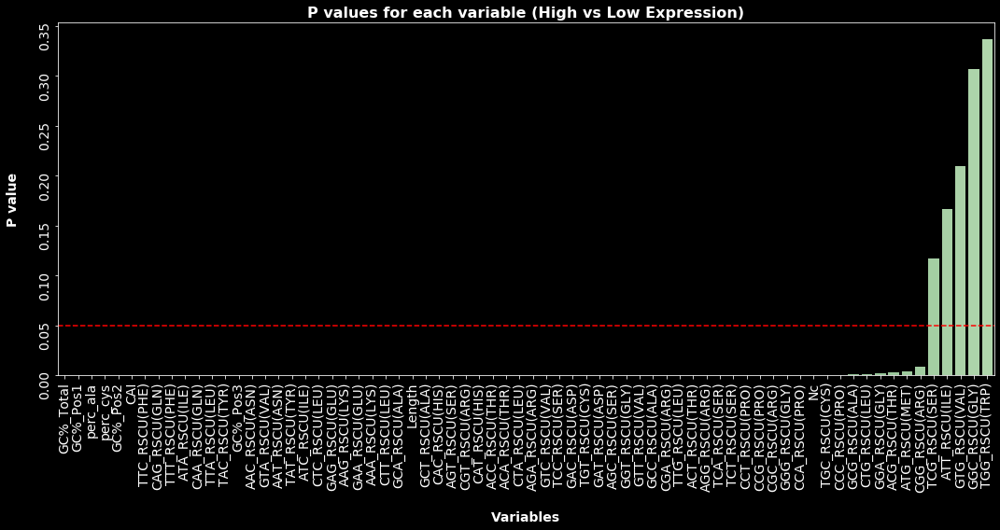

In [36]:
plt.style.use("dark_background")
plt.rcParams["figure.figsize"] = (15,8)
sns.barplot(x="variable",y="p", data=results_stats, palette="Greens_d")
plt.title("P values for each variable (High vs Low Expression)", fontsize=16, fontweight='bold')
plt.ylabel("P value", labelpad=20, fontsize=14, fontweight='bold')
plt.xlabel("Variables", labelpad=20, fontsize=14, fontweight='bold')
plt.xticks(rotation=90, fontsize=14)
plt.yticks(rotation=90, fontsize=14)
plt.axhline(y=0.05, color='r', linestyle='--')
plt.tight_layout()
plt.savefig("figures/p_values.png", dpi=400)
plt.show()

* **Box-Plots to investigate differences in gene expression among plant tissues**:

> Next I will check whether if there are significant differences among plant tissues in regards to gene expression. This could be an interesting categorical variable to include in the modeling.

In [220]:
df_CUB_metrics["Tissue"].value_counts()

root         7037
flower       6693
root/leaf    6573
leaf         5046
pollen       1516
Name: Tissue, dtype: int64

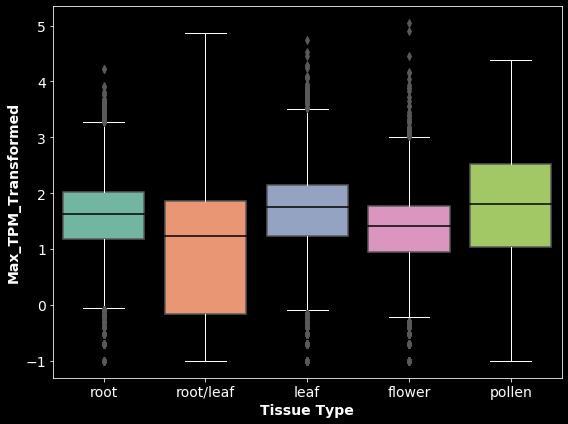

In [175]:
plt.figure(figsize=(8, 6))

boxprops = dict(color="white",linewidth=1)
medianprops = dict(color="black",linewidth=1.5)
whiskerprops = dict(color="white",linewidth=1)
capprops = dict(color="white",linewidth=1)
flierprops = dict(color="yellow",linewidth=1)
col_palette = sns.color_palette("Set2")
sns.boxplot(x = "Tissue", y = "Max_TPM_Transformed", palette=col_palette, data = df_CUB_metrics,
            capprops=capprops, flierprops=flierprops, whiskerprops=whiskerprops, medianprops=medianprops)

plt.xlabel('Tissue Type', fontsize=14, fontweight='bold')
plt.ylabel("Max_TPM_Transformed", fontsize=14, fontweight='bold')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.tight_layout()
plt.savefig("figures/box_plot_expresssion_tissues.png", dpi=300, bbox_inches="tight")
plt.show()

In [176]:
root_data = df_CUB_metrics.loc[df_CUB_metrics["Tissue"] == "root"]["Max_TPM_Transformed"]
root_leaf_data = df_CUB_metrics.loc[df_CUB_metrics["Tissue"] == "root/leaf"]["Max_TPM_Transformed"]
leaf_data = df_CUB_metrics.loc[df_CUB_metrics["Tissue"] == "leaf"]["Max_TPM_Transformed"]
flower_data = df_CUB_metrics.loc[df_CUB_metrics["Tissue"] == "flower"]["Max_TPM_Transformed"]
pollen_data = df_CUB_metrics.loc[df_CUB_metrics["Tissue"] == "pollen"]["Max_TPM_Transformed"]

In [177]:
from scipy.stats import kruskal
# seed the random number generator
# compare samples
stat, p = kruskal(root_data, root_leaf_data, leaf_data, flower_data, pollen_data)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
	print('Same distributions (fail to reject H0)')
else:
	print('Different distributions (reject H0)')

Statistics=1705.377, p=0.000
Different distributions (reject H0)


> We observe statistically significant differences in the expression level among tissue types. I will include this information as categorical dummy variables for the modeling.

* **Pair-Wise Relactionships and Correlation Plots**:

> I will make a pair-wise corr plot of the highest correlated variables to study the relactionships among the features.
> Since our target variable is not normally distributed I will use spearmanr correlation.

In [37]:
# creating a numerical variable list to perform the correlation analyses
list_variables = list(df_CUB_metrics.select_dtypes(include=["int64", "float64"]).drop(["Max TPM", "Max_TPM_Transformed"], axis=1).columns)

In [38]:
from scipy.stats import spearmanr
coef_list = []
p_list = []
for i in list_variables:
    coef, p = spearmanr(df_CUB_metrics["Max_TPM_Transformed"],df_CUB_metrics[i])
    coef_list.append(coef)
    p_list.append(p)

In [39]:
# creating a df with the results
results_corr = pd.DataFrame.from_dict(dict(zip(coef_list, p_list)), orient="index") # create a df from dict
results_corr = results_corr.reset_index() 
results_corr = pd.concat([pd.Series(list_variables),results_corr], axis=1) # add the variable names
results_corr.columns=["variable", "coef", "p_value"] # name columns

In [40]:
results_corr.head()

,variable,coef,p_value
0,Length,0.077673,3.128487e-37
1,CAI,0.175872,1.464136e-185
2,Nc,-0.034668,1.318214e-08
3,TGT_RSCU(CYS),-0.061898,3.158250e-24
4,TGC_RSCU(CYS),0.027120,8.762596e-06


In [41]:
# calculating the corr among variables and selecting the highest correlations
results_corr["coef_absolute"] = results_corr["coef"].abs()

Lets look at the variables with the highest spearsman coeficient:

In [42]:
results_corr.sort_values(by="coef_absolute", ascending=False)[:10].reset_index(drop=True)

,variable,coef,p_value,coef_absolute
0,GC%_Total,0.351358,0.000000e+00,0.351358
1,perc_ala,0.304092,0.000000e+00,0.304092
2,GC%_Pos1,0.302168,0.000000e+00,0.302168
3,perc_cys,-0.207010,7.676786e-258,0.207010
4,GC%_Pos2,0.184512,2.356002e-204,0.184512
5,CAI,0.175872,1.464136e-185,0.175872
6,TTC_RSCU(PHE),0.175579,6.093592e-185,0.175579
7,CAG_RSCU(GLN),0.170648,1.161864e-174,0.170648
8,TTT_RSCU(PHE),-0.169942,3.241571e-173,0.169942
9,ATA_RSCU(ILE),-0.157140,4.397299e-148,0.157140


Lets create a pair_plot to observe the relactionships among top 7 correlated features

In [56]:
list_top_6_corr = list(results_corr.sort_values(by="coef_absolute", ascending=False)[:6].reset_index(drop=True)["variable"])

In [57]:
list_top_6_corr.append("Expression_Level") # adding the expression level variable to get color in the plot
list_top_6_corr.insert(0, "Max_TPM_Transformed") # adding the target variable 

In [58]:
df_corr_pair = df_CUB_metrics[list_top_6_corr]

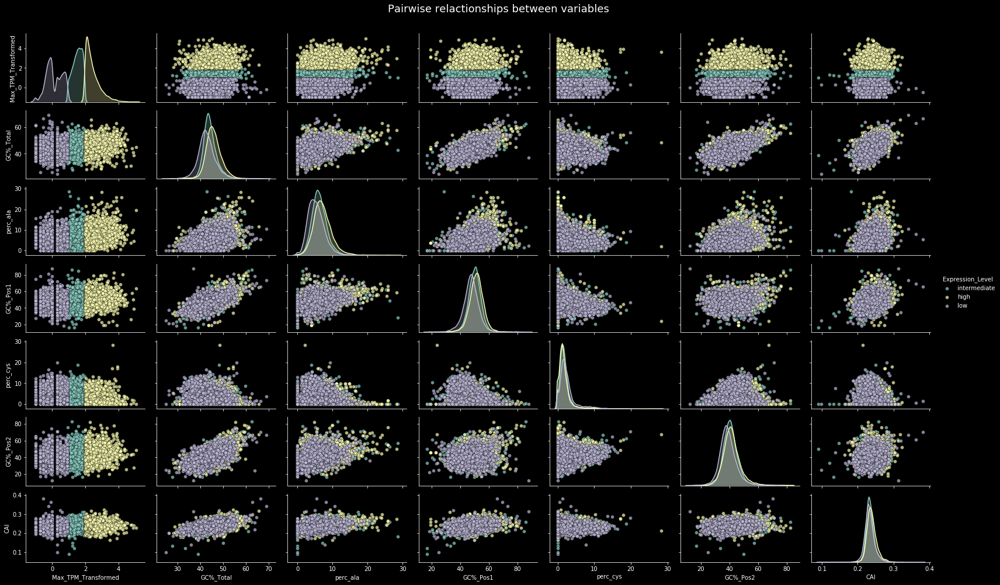

In [59]:
plt.style.use("dark_background")
g = sns.pairplot(data=df_corr_pair,hue="Expression_Level", height=2, aspect=1.6,
                  plot_kws=dict(edgecolor="k", linewidth=0.5, alpha=0.7),
                  diag_kind="kde", diag_kws=dict(shade=True))

fig = g.fig  
fig.subplots_adjust(top=0.93, wspace=0.1)
t = fig.suptitle('Pairwise relactionships between variables', fontsize=18)
fig.savefig("figures/Pair-kde.png", dpi=400, bbox_inches="tight")
plt.show()


> This plot highlights again the positive correlation between the cys content and the expression level, as well as the negative correlation between ala content and the expression level.

> Next I make a scatter plot using the highest corr attribute (`GC%_Total`) and add a trending line where we can more clearly appreciate the **negative corr** existing between these two attributes.

In [60]:
from scipy import stats

slope, intercept, r_value, p_value, std_err = stats.linregress(df_CUB_metrics['GC%_Total'], df_CUB_metrics['Max_TPM_Transformed'])

In [61]:
slope

0.08852228513465488

In [62]:
intercept

-2.5311274256591942

In [63]:
r_value = round(r_value,2)

In [64]:
r_value

0.33

In [65]:
p_value

0.0

In [66]:
x = np.linspace(20,70,2)
y = slope*x+intercept # defining the equation to plot the trending line together with the scatterplot

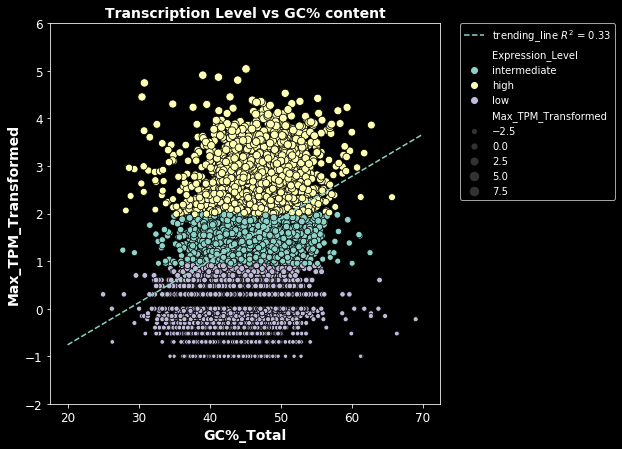

In [68]:
plt.figure(figsize=(7, 7))

sns.scatterplot(x='GC%_Total', y='Max_TPM_Transformed', data=df_CUB_metrics, hue='Expression_Level', size='Max_TPM_Transformed', edgecolor='black')
plt.plot(x, y,  '--', label='trending_line $R^2$ = {}'.format(r_value))
plt.xlabel('GC%_Total', fontsize=14, fontweight='bold')
plt.ylabel('Max_TPM_Transformed', fontsize=14, fontweight='bold')
plt.legend(bbox_to_anchor=(1.05, 1),  loc=2, borderaxespad=0)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.ylim(-2, 6)
plt.title("Transcription Level vs GC% content", fontsize=14, fontweight='bold')
plt.savefig('figures/plot_GC_vs_LogTPM.png', dpi=300, bbox_inches="tight")
plt.show()

In [299]:
df_CUB_metrics["Max TPM"].describe()

count     26865.000000
mean        187.458839
std        1375.182570
min           0.100000
25%           8.000000
50%          34.000000
75%          95.000000
max      109761.000000
Name: Max TPM, dtype: float64

In [33]:
# creating a numerical variable list to perform the correlation analyses
list_variables = list(df_CUB_metrics_high.select_dtypes(include=["int64", "float64"]).drop(["Max TPM", "Max_TPM_Transformed"], axis=1).columns)

In [34]:
from scipy.stats import spearmanr
coef_list = []
p_list = []
for i in list_variables:
    coef, p = spearmanr(df_CUB_metrics["Max_TPM_Transformed"],df_CUB_metrics[i])
    coef_list.append(coef)
    p_list.append(p)

In [35]:
# creating a df with the results
results_corr = pd.DataFrame.from_dict(dict(zip(coef_list, p_list)), orient="index") # create a df from dict
results_corr = results_corr.reset_index() 
results_corr = pd.concat([pd.Series(list_variables),results_corr], axis=1) # add the variable names
results_corr.columns=["variable", "coef", "p_value"] # name columns

In [36]:
# calculating the corr among variables and selecting the highest correlations
results_corr["coef_absolute"] = results_corr["coef"].abs()

In [37]:
results_corr = results_corr.sort_values(by="coef", ascending=False).reset_index(drop=True)

In [38]:
results_corr.to_csv("results_corr.csv", index=False)

In [54]:
rscu_corr = pd.read_csv("results_corr.csv")

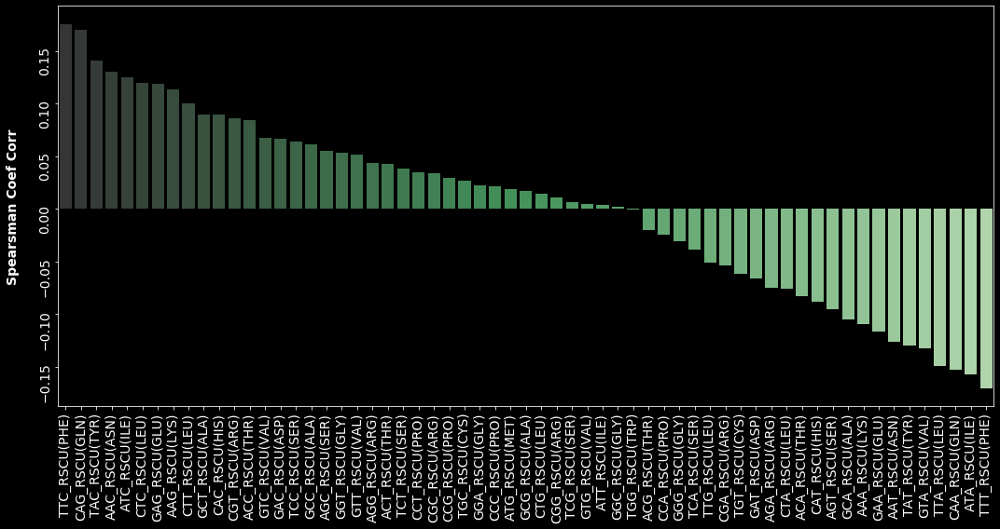

In [62]:
plt.style.use("dark_background")
plt.rcParams["figure.figsize"] = (15,8)
sns.barplot(x="variable",y="coef", data=rscu_corr, palette="Greens_d")
plt.ylabel("Spearsman Coef Corr", labelpad=20, fontsize=14, fontweight='bold')
plt.xlabel("", labelpad=20, fontsize=14, fontweight='bold')
plt.xticks(rotation=90, fontsize=14)
plt.yticks(rotation=90, fontsize=14)
plt.tight_layout()
plt.savefig("figures/RSCU_corr.png", dpi=400)
plt.show()

In [32]:
# df to inlude only high_expressed genes. Did the same for low and intermediate
df_CUB_metrics_high = df_CUB_metrics.loc[(df_CUB_metrics["Max TPM"] >= 8)&(df_CUB_metrics["Max TPM"] <= 90)].reset_index(drop=True)

In [33]:
# creating a numerical variable list to perform the correlation analyses
list_variables = list(df_CUB_metrics_high.select_dtypes(include=["int64", "float64"]).drop(["Max TPM", "Max_TPM_Transformed"], axis=1).columns)

In [34]:
from scipy.stats import spearmanr
coef_list = []
p_list = []
for i in list_variables:
    coef, p = spearmanr(df_CUB_metrics_high["Max_TPM_Transformed"],df_CUB_metrics_high[i])
    coef_list.append(coef)
    p_list.append(p)

In [35]:
# creating a df with the results
results_corr_high = pd.DataFrame.from_dict(dict(zip(coef_list, p_list)), orient="index") # create a df from dict
results_corr_high = results_corr_high.reset_index() 
results_corr_high = pd.concat([pd.Series(list_variables),results_corr], axis=1) # add the variable names
results_corr_high.columns=["variable", "coef", "p_value"] # name columns

In [36]:
# calculating the corr among variables and selecting the highest correlations
results_corr_high["coef_absolute"] = results_corr_high["coef"].abs()

In [37]:
results_corr_high = results_corr_high.sort_values(by="coef", ascending=False).reset_index(drop=True)

In [38]:
results_corr_high.to_csv("results_corr_high.csv", index=False)

Lets look at the variables with the highest spearsman coeficient:

In [39]:
results_corr_high["p_value"] = round(results_corr["p_value"],3)

In [40]:
results_corr_high.reset_index(drop=True)

,variable,coef,p_value,coef_absolute
0,GC%_Pos1,0.175033,0.000,0.175033
1,GC%_Total,0.161871,0.000,0.161871
2,perc_ala,0.155507,0.000,0.155507
3,CAI,0.068566,0.000,0.068566
4,GC%_Pos2,0.068504,0.000,0.068504
5,CAG_RSCU(GLN),0.068429,0.000,0.068429
6,TTC_RSCU(PHE),0.049656,0.000,0.049656
7,GAG_RSCU(GLU),0.046699,0.000,0.046699
8,CGT_RSCU(ARG),0.043397,0.000,0.043397
9,CTT_RSCU(LEU),0.037891,0.000,0.037891


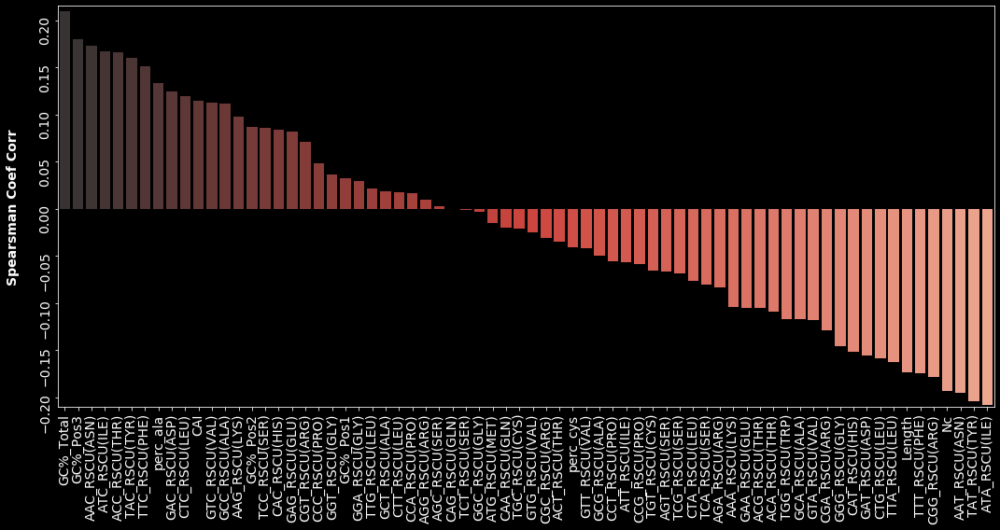

In [378]:
plt.style.use("dark_background")
plt.rcParams["figure.figsize"] = (15,8)
sns.barplot(x="variable",y="coef", data=results_corr_high, palette="Reds_d")
plt.ylabel("Spearsman Coef Corr", labelpad=20, fontsize=14, fontweight='bold')
plt.xlabel("", labelpad=20, fontsize=14, fontweight='bold')
plt.xticks(rotation=90, fontsize=14)
plt.yticks(rotation=90, fontsize=14)
plt.ylim(-0.21, 0.215) # to compare low/intermediate and high
plt.tight_layout()
plt.savefig("figures/corr_high.png", dpi=400)
plt.show()

* **Codon candidates with large predictive power: box plots**:

> Below I create boxplots to compare the RSCU values for the most corr codons among the different expression level classes(low, intermediate, high).

In [51]:
RCSU_highest_corr = ["TTC_RSCU(PHE)", "CAG_RSCU(GLN)", "TAC_RSCU(TYR)",
                    "CAA_RSCU(GLN)", "ATA_RSCU(ILE)", "TTT_RSCU(PHE)"]

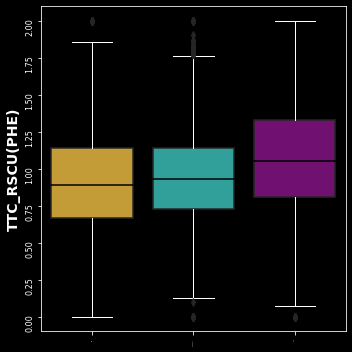

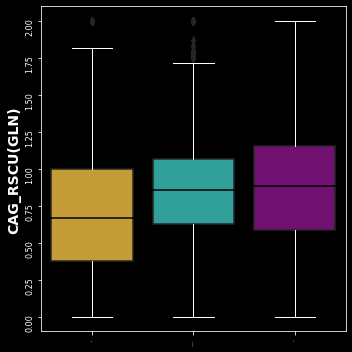

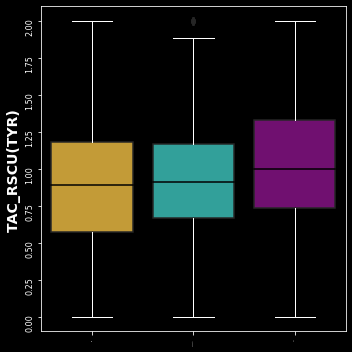

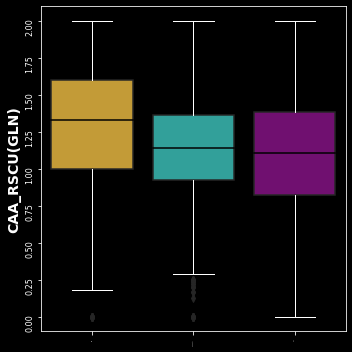

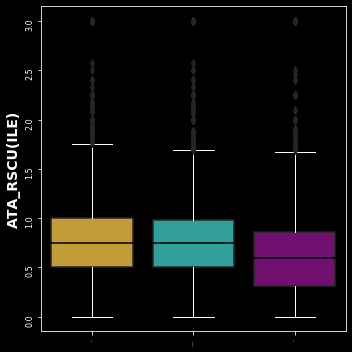

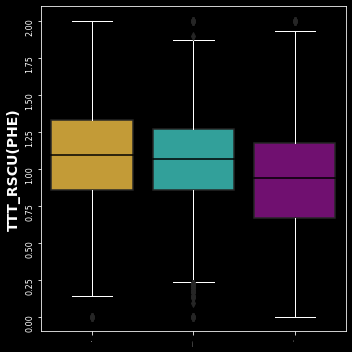

In [52]:
for i in RCSU_highest_corr:
    plt.figure(figsize=(5, 5))

    boxprops = dict(color="white",linewidth=1)
    medianprops = dict(color="black",linewidth=1.5)
    whiskerprops = dict(color="white",linewidth=1)
    capprops = dict(color="white",linewidth=1)
    flierprops = dict(color="yellow",linewidth=1)
    col_palette = ["goldenrod", "lightseagreen", "purple"]
    
    sns.boxplot(x = 'Expression_Level', y = i, palette=col_palette, data = df_CUB_metrics.sort_values(by="Expression_Level", ascending=False),
                capprops=capprops, flierprops=flierprops, whiskerprops=whiskerprops, medianprops=medianprops)

    plt.xlabel("", fontsize=14, fontweight='bold', rotation = 90)
    plt.ylabel(i, fontsize=14, fontweight='bold', rotation = 90)
    plt.xticks(fontsize=0, rotation = 90)
    plt.yticks(fontsize=8, rotation = 90)
    plt.tight_layout()
    plt.savefig("figures/{}_vs_Expression_Level.png".format(i), dpi=300, bbox_inches="tight")
    plt.show()

### **Step 3**: Exploring the predictive value and feature importance of the CUB metrics: A traditional ML approach.

> For this several candidate algorithms will be trained and the best performing model will be fine tuned.

* **Import libraries needed**:

In [43]:

# Splitting data
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedShuffleSplit

# Data preprocessing
from sklearn.preprocessing import StandardScaler

# Models
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
import xgboost as xgb
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import AdaBoostRegressor
from catboost import CatBoostRegressor

# Model selection and evaluation
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn import metrics

* **Select the data for the modeling**:

In [4]:
df_CUB_metrics = pd.read_csv("data/df_cub_metrics.csv") 

In [97]:
results_stats = pd.read_csv("statistical_tests/all_tests_combined.csv")

In [44]:
feature_list = list(results_stats.loc[results_stats["p"]<=0.05]["variable"]) #selecting the variables that appear to correlate with Max TPM and whose p<0.05 

In [46]:
feature_list.append("Tissue") # appending the categorical variable tissue

In [47]:
feature_list.append("Max_TPM_Transformed") # append the target variable Max_TPM_transformed

In [48]:
df_model = df_CUB_metrics[feature_list]

In [49]:
df_model

,GC%_Total,GC%_Pos1,perc_ala,perc_cys,GC%_Pos2,CAI,TTC_RSCU(PHE),CAG_RSCU(GLN),TTT_RSCU(PHE),ATA_RSCU(ILE),CAA_RSCU(GLN),TTA_RSCU(LEU),TAC_RSCU(TYR),GC%_Pos3,AAC_RSCU(ASN),GTA_RSCU(VAL),AAT_RSCU(ASN),TAT_RSCU(TYR),ATC_RSCU(ILE),CTC_RSCU(LEU),GAG_RSCU(GLU),AAG_RSCU(LYS),GAA_RSCU(GLU),AAA_RSCU(LYS),CTT_RSCU(LEU),GCA_RSCU(ALA),Length,GCT_RSCU(ALA),CAC_RSCU(HIS),AGT_RSCU(SER),CGT_RSCU(ARG),CAT_RSCU(HIS),ACC_RSCU(THR),ACA_RSCU(THR),CTA_RSCU(LEU),AGA_RSCU(ARG),GTC_RSCU(VAL),TCC_RSCU(SER),GAC_RSCU(ASP),TGT_RSCU(CYS),GAT_RSCU(ASP),AGC_RSCU(SER),GGT_RSCU(GLY),GTT_RSCU(VAL),GCC_RSCU(ALA),CGA_RSCU(ARG),TTG_RSCU(LEU),ACT_RSCU(THR),AGG_RSCU(ARG),TCA_RSCU(SER),TCT_RSCU(SER),CCT_RSCU(PRO),CCG_RSCU(PRO),CGC_RSCU(ARG),GGG_RSCU(GLY),CCA_RSCU(PRO),Nc,TGC_RSCU(CYS),CCC_RSCU(PRO),GCG_RSCU(ALA),CTG_RSCU(LEU),GGA_RSCU(GLY),ACG_RSCU(THR),ATG_RSCU(MET),CGG_RSCU(ARG),Tissue,Max_TPM_Transformed
0,44.108527,48.837209,3.02,0.93,36.046512,0.231619,1.059,1.231,0.941,0.444,0.769,0.240,1.053,47.441860,1.231,0.296,0.769,0.947,1.111,1.440,1.030,1.000,0.970,1.000,1.200,2.154,1290,1.231,1.000,1.304,1.895,1.000,0.706,0.706,0.240,1.263,1.037,0.391,0.690,1.000,1.310,1.174,1.600,1.778,0.308,0.632,2.400,2.118,1.263,1.043,1.435,1.800,0.400,0.632,0.640,1.000,57.010,1.000,0.800,0.308,0.480,1.120,0.471,1.0,0.316,root,1.662758
1,38.753388,39.430894,6.10,3.25,33.739837,0.219198,0.889,0.800,1.111,0.750,1.200,0.706,0.889,43.089431,0.750,1.333,1.250,1.111,0.857,0.529,0.667,1.400,1.333,0.600,1.235,1.333,738,0.533,1.600,0.857,0.429,0.400,0.571,1.714,0.706,4.714,1.111,0.571,0.333,0.750,1.667,0.857,2.222,0.667,0.800,0.000,1.941,1.714,0.429,1.143,2.286,0.667,1.333,0.429,0.444,2.000,54.313,1.250,0.000,1.333,0.882,1.333,0.000,1.0,0.000,root/leaf,1.431364
2,45.775302,49.303621,2.79,0.56,42.061281,0.230129,1.375,0.353,0.625,0.545,1.647,1.286,0.714,45.961003,1.172,0.444,0.828,1.286,1.091,1.286,0.933,0.714,1.067,1.286,1.071,1.600,1077,2.000,0.889,0.150,1.364,1.111,1.067,1.333,1.071,2.455,1.111,1.350,0.815,2.000,1.185,1.350,0.828,1.111,0.000,0.545,1.071,0.800,1.364,1.200,1.650,1.037,1.630,0.000,0.690,0.889,56.828,0.000,0.444,0.400,0.214,1.517,0.800,1.0,0.273,leaf,1.079181
3,43.764172,54.683412,7.43,1.83,38.199895,0.238449,0.696,0.838,1.304,0.654,1.162,0.786,0.857,38.409210,0.842,0.428,1.158,1.143,0.846,0.679,1.104,0.978,0.896,1.022,2.214,1.014,5733,1.887,0.682,1.157,0.778,1.318,0.350,1.700,0.607,2.222,0.403,0.386,0.482,1.257,1.518,0.771,1.531,2.214,0.423,0.667,1.286,1.200,1.778,1.414,1.671,2.234,0.571,0.111,0.812,0.779,50.620,0.743,0.416,0.676,0.429,1.219,0.750,1.0,0.444,leaf,1.397940
4,44.600939,56.807512,5.16,1.41,33.802817,0.230825,1.000,2.000,1.000,0.000,0.000,0.632,1.400,43.192488,1.250,0.235,0.750,0.600,1.312,1.895,0.667,1.000,1.333,1.000,1.579,0.727,639,2.182,1.333,0.500,2.800,0.667,0.667,1.333,0.000,1.200,0.706,1.000,1.000,2.000,1.000,0.500,1.500,1.882,0.727,0.400,0.632,2.000,1.200,2.500,1.500,2.400,0.267,0.400,0.000,1.067,48.680,0.000,0.267,0.364,1.263,2.500,0.000,1.0,0.000,root,2.235528
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26860,47.031963,50.000000,6.85,2.05,38.356164,0.246330,0.000,0.571,2.000,0.600,1.429,1.200,0.750,52.739726,0.800,2.000,1.200,1.250,0.900,1.200,1.667,1.333,0.333,0.667,0.300,0.400,438,0.800,0.000,0.545,1.500,0.000,0.500,1.500,0.600,0.000,0.000,1.091,0.667,1.333,1.333,0.545,0.889,1.500,2.400,0.000,1.200,1.500,1.500,1.091,1.091,0.444,0.889,3.000,0.444,0.000,60.414,0.667,2.667,0.400,1.500,0.889,0.500,1.0,0.000,root/leaf,1.491362
26861,41.729798,46.780303,6.82,0.76,42.045455,0.213750,0.816,0.333,1.184,0.750,1.667,2.164,0.632,36.363636,0.471,1.026,1.529,1.368,1.091,0.689,0.500,0.600,1.500,1.400,0.984,1.333,1584,1.889,0.118,1.833,2.500,1.882,1.111,1.111,0.787,1.000,0.615,0.833,0.615,1.500,1.385,0.667,1.236,1.436,0.667,2.000,0.492,1.556,

In [50]:
df_model.to_csv("data/df_model.csv", index=False)

* **Create the binary (dummy) variables**:

I will use `get_dummies()` for this

In [51]:
df_model = pd.get_dummies(df_model)

In [52]:
df_model.head()

,GC%_Total,GC%_Pos1,perc_ala,perc_cys,GC%_Pos2,CAI,TTC_RSCU(PHE),CAG_RSCU(GLN),TTT_RSCU(PHE),ATA_RSCU(ILE),CAA_RSCU(GLN),TTA_RSCU(LEU),TAC_RSCU(TYR),GC%_Pos3,AAC_RSCU(ASN),GTA_RSCU(VAL),AAT_RSCU(ASN),TAT_RSCU(TYR),ATC_RSCU(ILE),CTC_RSCU(LEU),GAG_RSCU(GLU),AAG_RSCU(LYS),GAA_RSCU(GLU),AAA_RSCU(LYS),CTT_RSCU(LEU),GCA_RSCU(ALA),Length,GCT_RSCU(ALA),CAC_RSCU(HIS),AGT_RSCU(SER),CGT_RSCU(ARG),CAT_RSCU(HIS),ACC_RSCU(THR),ACA_RSCU(THR),CTA_RSCU(LEU),AGA_RSCU(ARG),GTC_RSCU(VAL),TCC_RSCU(SER),GAC_RSCU(ASP),TGT_RSCU(CYS),GAT_RSCU(ASP),AGC_RSCU(SER),GGT_RSCU(GLY),GTT_RSCU(VAL),GCC_RSCU(ALA),CGA_RSCU(ARG),TTG_RSCU(LEU),ACT_RSCU(THR),AGG_RSCU(ARG),TCA_RSCU(SER),TCT_RSCU(SER),CCT_RSCU(PRO),CCG_RSCU(PRO),CGC_RSCU(ARG),GGG_RSCU(GLY),CCA_RSCU(PRO),Nc,TGC_RSCU(CYS),CCC_RSCU(PRO),GCG_RSCU(ALA),CTG_RSCU(LEU),GGA_RSCU(GLY),ACG_RSCU(THR),ATG_RSCU(MET),CGG_RSCU(ARG),Max_TPM_Transformed,Tissue_flower,Tissue_leaf,Tissue_pollen,Tissue_root,Tissue_root/leaf
0,44.108527,48.837209,3.02,0.93,36.046512,0.231619,1.059,1.231,0.941,0.444,0.769,0.240,1.053,47.441860,1.231,0.296,0.769,0.947,1.111,1.440,1.030,1.000,0.970,1.000,1.200,2.154,1290,1.231,1.000,1.304,1.895,1.000,0.706,0.706,0.240,1.263,1.037,0.391,0.690,1.000,1.310,1.174,1.600,1.778,0.308,0.632,2.400,2.118,1.263,1.043,1.435,1.800,0.400,0.632,0.640,1.000,57.010,1.000,0.800,0.308,0.480,1.120,0.471,1.0,0.316,1.662758,0,0,0,1,0
1,38.753388,39.430894,6.10,3.25,33.739837,0.219198,0.889,0.800,1.111,0.750,1.200,0.706,0.889,43.089431,0.750,1.333,1.250,1.111,0.857,0.529,0.667,1.400,1.333,0.600,1.235,1.333,738,0.533,1.600,0.857,0.429,0.400,0.571,1.714,0.706,4.714,1.111,0.571,0.333,0.750,1.667,0.857,2.222,0.667,0.800,0.000,1.941,1.714,0.429,1.143,2.286,0.667,1.333,0.429,0.444,2.000,54.313,1.250,0.000,1.333,0.882,1.333,0.000,1.0,0.000,1.431364,0,0,0,0,1
2,45.775302,49.303621,2.79,0.56,42.061281,0.230129,1.375,0.353,0.625,0.545,1.647,1.286,0.714,45.961003,1.172,0.444,0.828,1.286,1.091,1.286,0.933,0.714,1.067,1.286,1.071,1.600,1077,2.000,0.889,0.150,1.364,1.111,1.067,1.333,1.071,2.455,1.111,1.350,0.815,2.000,1.185,1.350,0.828,1.111,0.000,0.545,1.071,0.800,1.364,1.200,1.650,1.037,1.630,0.000,0.690,0.889,56.828,0.000,0.444,0.400,0.214,1.517,0.800,1.0,0.273,1.079181,0,1,0,0,0
3,43.764172,54.683412,7.43,1.83,38.199895,0.238449,0.696,0.838,1.304,0.654,1.162,0.786,0.857,38.409210,0.842,0.428,1.158,1.143,0.846,0.679,1.104,0.978,0.896,1.022,2.214,1.014,5733,1.887,0.682,1.157,0.778,1.318,0.350,1.700,0.607,2.222,0.403,0.386,0.482,1.257,1.518,0.771,1.531,2.214,0.423,0.667,1.286,1.200,1.778,1.414,1.671,2.234,0.571,0.111,0.812,0.779,50.620,0.743,0.416,0.676,0.429,1.219,0.750,1.0,0.444,1.397940,0,1,0,0,0
4,44.600939,56.807512,5.16,1.41,33.802817,0.230825,1.000,2.000,1.000,0.000,0.000,0.632,1.400,43.192488,1.250,0.235,0.750,0.600,1.312,1.895,0.667,1.000,1.333,1.000,1.579,0.727,639,2.182,1.333,0.500,2.800,0.667,0.667,1.333,0.000,1.200,0.706,1.000,1.000,2.000,1.000,0.500,1.500,1.882,0.727,0.400,0.632,2.000,1.200,2.500,1.500,2.400,0.267,0.400,0.000,1.067,48.680,0.000,0.267,0.364,1.263,2.500,0.000,1.0,0.000,2.235528,0,0,0,1,0


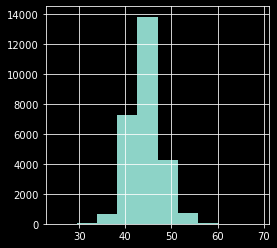

In [53]:
plt.figure(figsize=(4, 4))
plt.style.use("dark_background")
df_model["GC%_Total"].hist(bins=10)
plt.show()

* **Data Split**:

> We want that after our split, we obtain a balanced distribution of the target values accross the data. 

> Since it has seen that `CG% Content` feature has the strongest corr. We will want our test set to be representative of the various categories of GC% content in dataset.

> For this I will create a strater column.

In [54]:
def strater (item):
    
    """creates a categorical variable to perform stratified split
    based on the feature with highest corr with the target variable"""
    
    if item <= 40:
        return 1
    elif item > 40 and item <= 43:
        return 2
    elif item > 43 and item <= 46:
        return 3
    elif item > 46 and item <= 50:
        return 4
    else:
        return 5

In [55]:
df_model["strat"] = df_model["GC%_Total"].apply(strater)

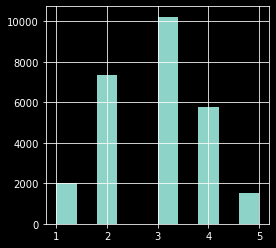

In [56]:
plt.rcParams["figure.figsize"] = (4,4)
df_model["strat"].hist(bins=10)
plt.show()

In [57]:
X = df_model.drop("Max_TPM_Transformed", axis=1) # feature df
y = df_model["Max_TPM_Transformed"].values # target variable array
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

In [58]:
test_set = X_test

In [59]:
test_set["strat"] = X_test["GC%_Total"].apply(strater)

In [60]:
split = StratifiedShuffleSplit(n_splits = 5, test_size=0.3, random_state=42)

In [61]:
for train_index, test_index in split.split(df_model, df_model["strat"]):
    strat_train_set = df_model.loc[train_index]
    strat_test_set = df_model.loc[test_index]

In [62]:
def proportions(data):
    return data["strat"].value_counts()/len(data)

In [63]:
comparing = pd.DataFrame({"Overall": proportions(df_model),
                         "Stratified": proportions(strat_test_set),
                         "Random": proportions(X_test)}).sort_index()

In [64]:
comparing = round(comparing *100,2) 

In [65]:
comparing

,Overall,Stratified,Random
1,7.49,7.49,7.59
2,27.38,27.38,27.15
3,38.07,38.06,38.42
4,21.38,21.39,20.92
5,5.68,5.67,5.92


> We can observe how the proportions of GC% in the stratified set are closer 
to those in the whole set compared to the ramdomly generated set.

In [66]:
strat_train_set.drop("strat", axis=1, inplace=True)
strat_test_set.drop("strat", axis=1, inplace=True)

In [67]:
X_train = strat_train_set.drop(["Max_TPM_Transformed"], axis=1)
y_train = strat_train_set["Max_TPM_Transformed"].values

In [68]:
X_test = strat_test_set.drop(["Max_TPM_Transformed"], axis=1)
y_test = strat_test_set["Max_TPM_Transformed"].values

In [69]:
df_model.drop("strat", axis=1, inplace=True)
X.drop("strat", axis=1, inplace=True)

* **Data Preprocessing**:

> Since our data variables have sparce scales, we should Standarize the data. I will be using the **StandardScaler()** Sklearn method for this.

> (Not need to standarize the dummy variables)

> Standarize train and test sets. Not need to standarize binary (dummy) variables.

In [70]:
scaler = StandardScaler().fit(X_train.iloc[:,:5]) # not dummy variables

X_train_nodummy = scaler.transform(X_train.iloc[:,:5])
X_test_nodummy = scaler.transform(X_test.iloc[:,:5])

In [71]:
X_train_rescaled = np.concatenate((X_train_nodummy,X_train.iloc[:,5:]), axis=1)
X_test_rescaled = np.concatenate((X_test_nodummy,X_test.iloc[:,5:]), axis=1)

In [72]:
X_train.shape

(18805, 70)

In [73]:
X_test.shape

(8060, 70)

* **Exploring Model Performance**:

Metrics used neg_mean_squared_error(neg-mae) using cross-validation. I chose neg-mae because it penalizes less the differences between the predicted values and observed value, which is what we want when we have some outliers in the data.

In [74]:
# Exploring model performance. 

models = []

models.append(('LR', LinearRegression()))
models.append(('Lasso', Lasso())) 
models.append(('EN', ElasticNet()))
models.append(('KNN', KNeighborsRegressor()))
models.append(('SVR', SVR())) 
models.append(('ABR', AdaBoostRegressor())) 
models.append(('GBR', GradientBoostingRegressor())) 
models.append(('RFR', RandomForestRegressor()))
models.append(('ETR', ExtraTreesRegressor()))

xgbr_params = {'objective':'reg:squarederror'}
models.append(('XGB', xgb.XGBRegressor(**xgbr_params)))

results_model = []
names_model = []
run_time = []
for name, model in models:
    KF = KFold(n_splits=5, random_state=42)
    start = dt.datetime.now()
    cv_results = cross_val_score(model, X_train_rescaled, y_train, cv=KF, scoring='neg_mean_absolute_error')
    results_model.append(cv_results)
    names_model.append(name)
    end  = dt.datetime.now() 
    duration = (end-start).seconds
    run_time.append(duration)
    msg = "%s: %s (%s) Running time: %s sec" % (name, round(cv_results.mean(),2), round(cv_results.std(),3), duration)
    print(msg)

LR: -0.6 (0.008) Running time: 0 sec
Lasso: -0.72 (0.008) Running time: 0 sec
EN: -0.71 (0.008) Running time: 0 sec
KNN: -0.72 (0.008) Running time: 2 sec
SVR: -0.69 (0.01) Running time: 112 sec
ABR: -0.7 (0.006) Running time: 27 sec
GBR: -0.58 (0.009) Running time: 74 sec
RFR: -0.57 (0.01) Running time: 269 sec
ETR: -0.57 (0.01) Running time: 95 sec
XGB: -0.58 (0.009) Running time: 11 sec


In [75]:
run_sec = [] # creating a list with the running time information to be used in the plot
for i in run_time:
    s = str(i)+"s"
    run_sec.append(s)

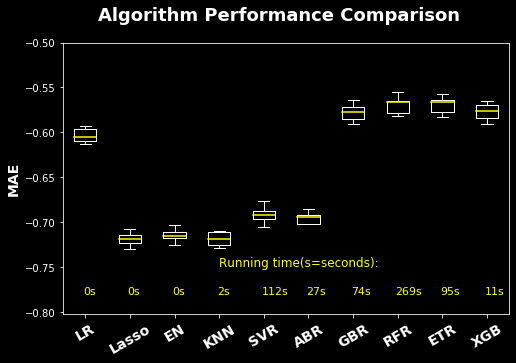

In [76]:
plt.style.use("dark_background")
plt.rcParams["figure.figsize"] = (8,5)
fig = plt.figure()
fig.suptitle('Algorithm Performance Comparison', fontsize=18, fontweight="bold")

boxprops = dict(color="white",linewidth=1)
medianprops = dict(color="yellow",linewidth=1.5)
whiskerprops = dict(color="white",linewidth=1)
capprops = dict(color="white",linewidth=1)
flierprops = dict(color="yellow",linewidth=1)

plt.boxplot(results_model, 
            boxprops=boxprops,
            medianprops=medianprops, 
            whiskerprops=whiskerprops, 
            capprops=capprops, 
            showfliers=True, 
            flierprops=flierprops)

x_values = list(range(1,len(run_sec)+1))
y_max = pd.DataFrame(results_model).max().max()
y_min = pd.DataFrame(results_model).min().min()

plt.text(s="Running time(s=seconds):", x = 4, y = y_min-0.02, color="yellow", fontsize=12) 
plt.ylim(y_min + 0.1*y_min, y_max - 0.1*y_max)
for i in range(len(x_values)):
    plt.text(s=run_sec[i], x = x_values[i]-0.05, y = y_min + 0.07*y_min, color="yellow", fontsize=11)  

ax = fig.add_subplot(111)
ax.set_xticklabels(names_model, rotation=30, fontsize=14, fontweight="bold")
ax.set_ylabel("MAE", fontsize=14, fontweight="bold")

plt.savefig("figures/algo_comparisson.png", dpi=400, bbox_inches="tight")

plt.show()

> Tree-based models seem to be performing better on this data. Next I will fine tune and evaluate the best performing model (ETR)

* **Fine tunning and model evaluation**:

> I will use GridSearchCV() to fine tune the model. I will optimize some of the most important hyperparameters in a ETR algorithm: `n_estimators`, `max_depth`, `min_samples_leaf` and `min_samples_split`


In [77]:



n_estimators = [90, 100, 110] 
max_depth = [13, 15, 18]
#min_samples_leaf = [2, 5, 11]

param_grid = dict(n_estimators=n_estimators, max_depth=max_depth)

model = ExtraTreesRegressor()
KF = KFold(n_splits=5, random_state=42) 
grid = GridSearchCV(
    estimator=model, param_grid=param_grid, scoring="neg_mean_squared_error", cv=KF)
grid_result = grid.fit(X_train, y_train)
print("Best: %f using %s"
      % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))
    # Best: -0.563830 using {'max_depth': 18, 'n_estimators': 110}

Best: -0.561944 using {'max_depth': 18, 'n_estimators': 110}
-0.570014 (0.020001) with: {'max_depth': 13, 'n_estimators': 90}
-0.569308 (0.020402) with: {'max_depth': 13, 'n_estimators': 100}
-0.569814 (0.019759) with: {'max_depth': 13, 'n_estimators': 110}
-0.566355 (0.019474) with: {'max_depth': 15, 'n_estimators': 90}
-0.567338 (0.021352) with: {'max_depth': 15, 'n_estimators': 100}
-0.566970 (0.020369) with: {'max_depth': 15, 'n_estimators': 110}
-0.563200 (0.017473) with: {'max_depth': 18, 'n_estimators': 90}
-0.564614 (0.020241) with: {'max_depth': 18, 'n_estimators': 100}
-0.561944 (0.019935) with: {'max_depth': 18, 'n_estimators': 110}


Tweaking some of the hyperparameters may be still needed to try making the model generalize better

In [78]:
EtReg = ExtraTreesRegressor(n_estimators=100, max_depth=12, min_samples_leaf=8, min_samples_split=3) # 
EtReg.fit(X_train_rescaled,y_train) # 130, 15, 3, 2

ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=12, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=8,
                    min_samples_split=3, min_weight_fraction_leaf=0.0,
                    n_estimators=100, n_jobs=None, oob_score=False,
                    random_state=None, verbose=0, warm_start=False)

In [79]:
score_train_EtReg = EtReg.score(X_train_rescaled, y_train) # 

In [80]:
score_train_EtReg

0.5687536112050714

In [81]:
score_test_EtReg = round(EtReg.score(X_test_rescaled, y_test),2) # 

In [82]:
score_test_EtReg 

0.3

In [83]:
y_pred = EtReg.predict(X_test_rescaled)
y_pred= y_pred.reshape(-1,1)

In [84]:
metrics.mean_squared_error(y_test, y_pred)

0.590057513962126

In [85]:
metrics.mean_absolute_error(y_test, y_pred)

0.58557250875155

I will now create a scatter plot including the test and the predicted data.

In [86]:
(y_test.reshape(-1,1)).shape

(8060, 1)

In [87]:
y_pred.shape

(8060, 1)

In [88]:
df_scatter = pd.DataFrame(np.concatenate((y_test.reshape(-1,1), y_pred), axis=1), columns=["y_test", "y_pred"])

In [89]:
df_scatter = df_scatter.set_index(test_index)

In [90]:
df_scatter.head()

,y_test,y_pred
17364,0.903090,1.397001
23196,-0.301030,1.202074
21677,1.380211,1.676697
21352,1.301030,0.971779
14930,1.755875,1.515061


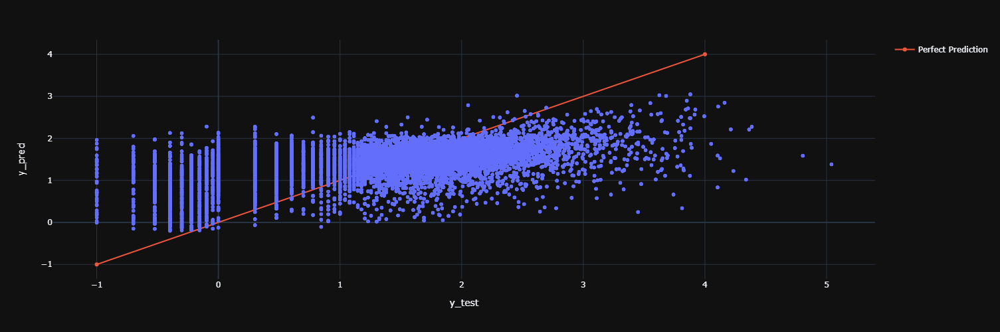

In [109]:
fig = px.scatter(df_scatter,
                x="y_test", 
                y="y_pred",
                hover_name=df_scatter.index,
                hover_data=[df_scatter.index],
                template="plotly_dark",
                 width=600, height=500)
fig.add_trace(go.Line(x=[-1,4], y=[-1,4], name="Perfect Prediction"))
fig.show()

Saving the model:

In [92]:
import pickle
with open ("models/ETR.pickle", "wb") as f:
    pickle.dump(EtReg,f)

In [93]:
columns = {"data_columns":[col.lower() for col in X.columns]}
with open("models/columns.json", "w") as f:
    f.write(json.dumps(columns))

Save also the standard scaler in case we want to use the model to get custom predictions(scaler)

In [94]:
with open ("models/scaler.pickle", "wb") as f:
    pickle.dump(scaler,f)

> This model could not reach high accuracy on the test set with out overfitting. Performing further feature engineering or adding more data would be two of the main ways to improve the model's accuracy and reduce overfitting on the test set.

> Regularization on the model could be achieved by reducing the `max_dept` or `n_estimators` hyperparameters, or increasing the `min_samples_leaf` and `min_samples_split`. This wouls help to reduce the poor generalization of the model.

> Nonetheless, as shown below, we can still use the model to explore the feature importance.

* **Feature importance**:

Here I will check the feature importance of the variables included in the modeling.

In [129]:
len(feature_list) # 67 features total

67

In [130]:
feat_imp = pd.Series(EtReg.feature_importances_)
features = pd.Series(X.columns)

In [131]:
feature_importance = pd.concat([features,feat_imp], axis=1, keys=["Feature","Importance"])

In [132]:
feature_importance = feature_importance.sort_values(by="Importance", ascending=False)

In [133]:
# Creating a column to contain the rest of the features importance grouped
cumulative_importance_other = feature_importance[27:]["Importance"].sum() 

In [134]:
rest_of_features = pd.DataFrame(["rest_of_features(40)", cumulative_importance_other])

In [135]:
rest_of_features = rest_of_features.T

In [136]:
rest_of_features.columns = ["Feature", "Importance"]

In [137]:
thirteen_top_features = feature_importance[:27]

In [138]:
feature_importance = pd.concat((thirteen_top_features, rest_of_features), axis=0).reset_index(drop=True)

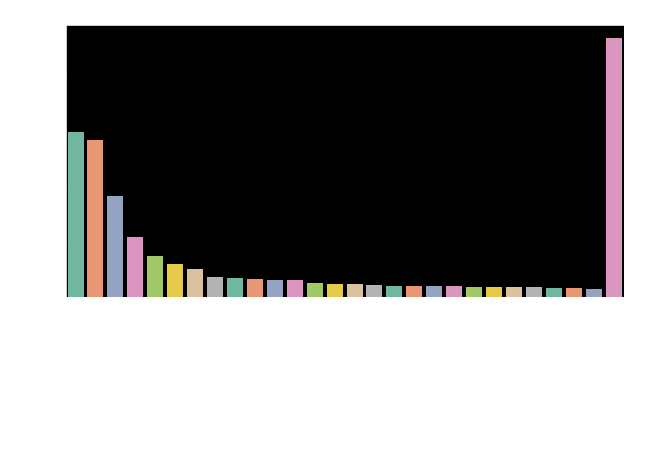

In [139]:
plt.rcParams["figure.figsize"] = (10,5)
imp_pallete = sns.color_palette("Set2")
sns.barplot(x="Feature", y="Importance", data=feature_importance, palette=imp_pallete)
plt.xticks(rotation=60, fontsize=14)
plt.ylabel("Importance", labelpad=15, fontsize=14, fontweight='bold')
plt.xlabel("Feature", labelpad=15, fontsize=14, fontweight='bold')
plt.title("Feature Importance ExtraTreeReg Model", fontsize=16, fontweight='bold')
plt.savefig("Figures/Feature_importance_EtReg.png", dpi=400, bbox_inches="tight")
plt.show()

See the spearseman coeficients in the table below:

In [128]:
results_corr.sort_values(by="coef_absolute", ascending=False)[:10].reset_index(drop=True) 

,variable,coef,p_value,coef_absolute
0,GC%_Total,0.351358,0.000000e+00,0.351358
1,perc_ala,0.304092,0.000000e+00,0.304092
2,GC%_Pos1,0.302168,0.000000e+00,0.302168
3,perc_cys,-0.207010,7.676786e-258,0.207010
4,GC%_Pos2,0.184512,2.356002e-204,0.184512
5,CAI,0.175872,1.464136e-185,0.175872
6,TTC_RSCU(PHE),0.175579,6.093592e-185,0.175579
7,CAG_RSCU(GLN),0.170648,1.161864e-174,0.170648
8,TTT_RSCU(PHE),-0.169942,3.241571e-173,0.169942
9,ATA_RSCU(ILE),-0.157140,4.397299e-148,0.157140


> We observe how there are many features that are contributing to the feature importance of the model, and it highlights how the differences in codon use bias follow a complex patter where many codons contribute to the observe differces in expression level. It would be interesting to test the performance of a deep neural network on the `df_model` data.

> Also, for most part, we can see that the feature importance of the model is in agreement with the corr analyses. 

> The most important features appear to be the tissue_root/leaf, followed by the total GC% content and the percentage of alanine.

## A Deep Learning Approach. 

The tranditional machine learning approach and study of CUB metrics resulted in a better understanding on some of the features responsable for expression level differences but those analyses indicate that they are not the only factors impacting transcription levels.

In this section I compare the performance of the same CNN architecture predicting the transcription level using the one_hot_encoded sequences for nucleotides, codons and aminoacids. This will give us valuable information about what sequences seem to play a larger role in the transcription level.

*Note: A ETL approach may be desired here, since in this particular case where the 0 padding takes up large amount of memory. We could use `tf.data.Dataset.from_tensor_slices` and perform the preprocessing steps in a tensor flow pipeline. This however would require that the preprocessing functions included in the `sequence_utils.py` are compatible with tf.* Furthermore, sparse matrices may help loading the data in memory.

In [19]:
# Importing DL libraries
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras
import tensorflow as tf
from tensorflow.keras.models import Sequential

In [67]:
keras.__version__

'2.4.0'

In [3]:
tf.__version__

'2.3.1'

In [4]:
df_CUB_metrics = pd.read_csv("data/df_cub_metrics.csv")

In [5]:
# Checking the longest sequence
df_CUB_metrics.loc[df_CUB_metrics["Length"] == df_CUB_metrics["Length"].max()]["Length"]/3 # The longest sequence is 16203 bases(5401 codonslong)

5545    5401.0
Name: Length, dtype: float64

### 1) CNN architecture:

* **Using a CNN architecture to predict transcription levels from one_hot_encoded(padded) sequences**:

Using googlecolab and taking advantage of the GPU runtime environment I will optimize the CNN architecture to create a model capable of predicting the transcription level of a gene based on its one_hot encoded codon sequence and one_hot aminoacid sequence.

A convolutional framework that consists of multiple layers was inspired by prior classification studies using CNNs (i.e. See Figure Below) [[Ref](https://www.biorxiv.org/content/10.1101/612762v1.full)].

> The framework has three components: input layer, encoder layer (multiple convolutional and dense
layers), and and two fully connected layers. 

> Each convolutional layer is composed of one 1-D convolutional layer with ReLU as the activation function and an average pooling layer.
A total of 6 convolution layers were included with a Kernel size of six.

> As regularization techniques I used L2 kernel_regularizator and dropout layer().

*Note: The training was performed in google colab to spped up the training by using the GPU environment.*

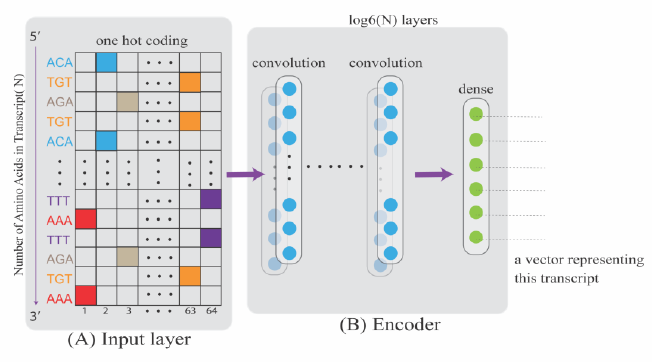

In [39]:
import PIL # image library tool

PIL.Image.open("figures/CNN_one_hot.png")

In [21]:
model = keras.models.Sequential([

    #Input layer:
    keras.layers.Conv1D(64, kernel_size=6, activation="relu", input_shape=[5401, 21]), #
    
    # Convolutional Layers
    keras.layers.Conv1D(128, activation="relu", kernel_size=6, kernel_regularizer=keras.regularizers.l2(0.01)),
    keras.layers.AveragePooling1D(),
    
    keras.layers.Conv1D(256, activation="relu", kernel_size=6, kernel_regularizer=keras.regularizers.l2(0.01)),
    keras.layers.AveragePooling1D(),
    
    keras.layers.Conv1D(256, activation="relu", kernel_size=6, kernel_regularizer=keras.regularizers.l2(0.01)),
    keras.layers.AveragePooling1D(),
    
    keras.layers.Conv1D(256, activation="relu", kernel_size=6, kernel_regularizer=keras.regularizers.l2(0.01)),
    keras.layers.AveragePooling1D(),
    
    keras.layers.Conv1D(128, activation="relu", kernel_size=6, kernel_regularizer=keras.regularizers.l2(0.01)),
    keras.layers.AveragePooling1D(),
    
    keras.layers.Conv1D(54, activation="relu", kernel_size=6, kernel_regularizer=keras.regularizers.l2(0.01)),
    keras.layers.AveragePooling1D(),

    # Global Max Pooling layer
    keras.layers.GlobalMaxPooling1D(),

    # Dense Layer
    keras.layers.Dense(1024, activation="relu", kernel_regularizer=keras.regularizers.l2(0.01)),
    keras.layers.Dropout(rate=0.5),
    # OutPut layer
    keras.layers.Dense(1, activation="linear") # Output layer
    
    ])
    


model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_7 (Conv1D)            (None, 5396, 64)          8128      
_________________________________________________________________
conv1d_8 (Conv1D)            (None, 5391, 128)         49280     
_________________________________________________________________
average_pooling1d_6 (Average (None, 2695, 128)         0         
_________________________________________________________________
conv1d_9 (Conv1D)            (None, 2690, 256)         196864    
_________________________________________________________________
average_pooling1d_7 (Average (None, 1345, 256)         0         
_________________________________________________________________
conv1d_10 (Conv1D)           (None, 1340, 256)         393472    
_________________________________________________________________
average_pooling1d_8 (Average (None, 670, 256)         

### 2) Training a CNN using the One_Hot_Encoded Sequences:

This was done for each of the one_hot_encoded sequences (Nucleotides, Codons and Aminoacids) following the same workflow as follows using the `cds_cod_1hot` as example.

In [7]:
from sequence_utils import __CODON_MAPPING__, __CODON_DICT__, __TRL_MAT__
from sequence_utils import one_hot_encode, padding_one_hot


print('\n1-hot encode to codon sequences:')
cds_cod_1hot = [one_hot_encode(seq, __CODON_MAPPING__) for seq in tqdm(df_CUB_metrics["CDS sequence"])]

print('\napply padding and make numpy array of 1-hot encoded codon sequences:')
cds_cod_1hot = padding_one_hot(cds_cod_1hot)

 39%|██████████████████████████████                                               | 390/1000 [00:00<00:00, 3876.53it/s]


1-hot encode to codon sequences:


100%|████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 7114.20it/s]



apply padding and make numpy array of 1-hot encoded codon sequences:


* **Splitting the data**:

In [54]:
X = cds_cod_1hot

In [55]:
y = subset["Max_TPM_Transformed"].values

I will split the data into test (15%), valid (15%) and train sets (70%).

In [56]:
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.15, random_state=42)
# remember than when using train_test_split we randomize the samples ✔

In [57]:
X_train_full = X_train_full 
X_test = X_test 
X_train, X_valid = X_train_full[:-4030], X_train_full[-4030:] #allocating 15% of the data to the valid set
y_train, y_valid = y_train_full[:-4030], y_train_full[-4030:]

In [21]:
# Removing some of the variables from memory
import gc

del [[X,y, cds_cod_1hot]] 
gc.collect()


72

We can keep track of the fine_tunning/training process using tensorboard:

In [66]:
import os

# 1) Defining the root log directory we will use for our TensorBoard logs
root_logdir = os.path.join(os.curdir, "my_logs")
# 2) Function that generates a subdirectory path for the current datetime so that it’s different at every 
def get_run_logdir():
    import time
    run_id = time.strftime("lr0.01_%Y_%m_%d-%H_%M_%S")
    return os.path.join(root_logdir, run_id)

run_logdir = get_run_logdir()

* **Setting up callbacks to save the best performing model and an early stopping with patience of 10**:

In [68]:
early_stopping_cb = keras.callbacks.EarlyStopping(patience=10)
checkpoint_cb = keras.callbacks.ModelCheckpoint("models/one_hot_codon_CNN_model.h5", save_best_only=True)
tensorboard_cb = keras.callbacks.TensorBoard(run_logdir)

* **Compiling the model**:

In [69]:
learning_rate = 0.0001

model.compile(loss="mean_absolute_error", optimizer=keras.optimizers.Adam(lr=learning_rate, decay=learning_rate/10),
                  metrics=["mae", "mse"])



* **Training the model**:

In [ ]:
history_training = model.fit(X_train, y_train, epochs=30, validation_data=(X_valid, y_valid), callbacks=[early_stopping_cb, checkpoint_cb, tensorboard_cb])

In [ ]:
%load_ext tensorboard
%tensorboard --logdir=./my_logs --port=6007

In [ ]:
model.evaluate(X_train, y_train)

### 3  Comparing the model performance:

* Model Evaluation using nucleotide_sequence :

> 126/126 [==============================] - 6s 51ms/step - loss: 0.6730 - mae: 0.6488 - mse: 0.7233 [0.673, 0.649, 0.723]

* Model Evaluation using codon_sequence :

> 126/126 [==============================] - 3s 24ms/step - loss: 0.6353 - mae: 0.5978 - mse: 0.6441 [0.635, 0.598, 0.644]

* Model Evaluation using aminoacid_sequence :

> 126/126 [==============================] - 3s 21ms/step - loss: 0.6665 - mae: 0.6420 - mse: 0.7034 [0.666, 0.642, 0.703]



I also created scatter plots including the `y_test` and the `y_predicted` data for each CNN model (Similar to what I did for the ETR model).

In the figure below we can compare the differences in model performance:

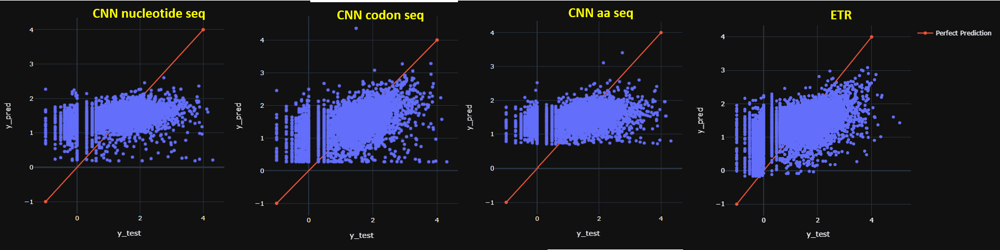

In [33]:
import PIL # image library tool

PIL.Image.open("figures/comparisson_models_performance.png")

##  **Conclussions**:

In this notebook, we have investigated the effect of CUB on the transcription level of Arabidopsis genes from the tissue in which they were expressed maximally. 

**Summary**:

* Based on the analyses performed in the present study, there are many codons that contribute the observed differences in the expression level, but out of the 61 codons, the ones that appeared to have a larger impact are:

           * CAG (Gln), GTC (Ala) -> Usage Positively correlated with expression
           * ATA (Ile), TTC (Phe) -> Usage Negatively correlated with expression


* Furthermore, analyses of the **codon usage frequency** revealed the importance of codons encoding alanine (GCT, GCC) and cysteine (TGT, TGC), and the percentage of alanine correlated positively with the expression level, whereas the percentage of cysteine correlated negatively.


* The **GC% content** was the feature with the strongest correlation, suggesting the importance of the GC content to explain the differences in gene transcription. This can be explained by mutation events such deamination that take place during the transcription process, which in turn may lead to a higher GC content in highly expressed genes [[Ref](https://www.nature.com/articles/ng1103z)].

* The **tissue** appears to be another important factor to explain the differences in expression level among genes. Furthemore, systematic differences in the usage of synonymous codons among *Arabidopsis thaliana* genes have been reported to be expressed specifically in distinct tissues [[Ref](https://pubmed.ncbi.nlm.nih.gov/22865738/)].

* The best performing CNN model was trained on the one_hot encoded codon sequence, which again reflects the importance of **codon usage patterns** in predicting the transcription level.

* Although we observed important associations between CUB and transcription levels, the predictions obtained from the machine learning models distant considerably from the test values. This indicates that there may be other important features determining the transcription level of genes such as the promoter or ribosome binding sites controlling the expression of the gene.

## **Future directions**: 

* To better understand the effects of CUB on the transcription level we could **include other parameters** not used in this analysis such as:

    * Codon Robustness Index (CRI).
    * Frequency of Optimal Codons (Fop).
    * Synonymous Codon Usage Order (SCUO).
    * Information-Based Codon Usage Bias (iCUB).
    * Codon Deviation Coefficient (CDC).


* Furthermore, we could import meta-data with information from the encoded protein such:

    * The function (Proteins with sorter life span will be synthesized at higher rates).
    * Size.
    * Hydrophobia.
    * Molecular weight.
    * Aromaticity


* Another interesting aspect to look at is the **effect of the relative intragenic position on the CUB**. For this we could split the CDS sequences into bins (e.g 10 bins) to study differences in CUB in different positions of the CDS sequence.